### Import

In [299]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.metrics import precision_score, recall_score, roc_auc_score
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.metrics import auc, accuracy_score, roc_curve

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

import lightgbm as lgb

from sklearn.feature_selection import SelectFromModel

from sklearn.metrics import fbeta_score, make_scorer

import joblib

import shap

In [308]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')


In [ ]:
plt.style.use('Solarize_Light2') # thème pour les graph

In [311]:
df_train.shape, df_test.shape

((215257, 244), (92254, 244))

In [312]:
# Séparer df_train en trainning et validation
X = df_train.drop(columns=['TARGET'])
y = df_train['TARGET']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

test => 30%
train => 52%
validation => 18%

### Fonction try_model

In [8]:
df_performance = pd.DataFrame()

In [65]:
def try_model(X_train, X_test, y_train, y_test, model, params, df_performance):
    
    model = model(**params)
    model.fit(X_train, y_train)
    
    model_score = model.score(X_train, y_train) # accuracy
    y_test_pred = model.predict(X_test)
    y_test_proba = model.predict_proba(X_test)[:, 1]
    
    recall = recall_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred)
    f1score = f1_score(y_test, y_test_pred)
    test_auc = roc_auc_score(y_test, y_test_proba)
    train_auc = roc_auc_score(y_train, model.predict_proba(X_train)[:, 1])
    matrice_confusion = confusion_matrix(y_test, y_test_pred)
    
    print(f'Matrice de confusion {model.__class__.__name__}: {matrice_confusion}')
    
    result = pd.DataFrame([{
        'Model': model.__class__.__name__,
        'Best Params': params,
        'Accuracy': model_score,
        'Recall': recall,
        'Precision': precision,
        'F1 Score': f1score,
        'Train AUC': train_auc,
        'Validation AUC': test_auc,
        'CV ROC AUC': None,
        'Matrice de confusion': matrice_confusion,
        'Méthode': 'feat.engin+reduc+max_iter'
        
    }])
    
    df_performance = pd.concat([df_performance, result], ignore_index=True)
    
    return df_performance, model



### Hyperparamètres par default

#### DummyClassifier

In [ ]:
model_dummy = DummyClassifier
params_dummy = {'strategy':'uniform'}
df_performance,  model_dummy_fitted= try_model(X_train, X_val, y_train, y_val, model_dummy, params_dummy, df_performance)

Matrice de confusion DummyClassifier: [[24653 24764]
 [ 2220  2178]]


#### LogisticRegression

In [ ]:
model_lr = LogisticRegression
params_lr = {'random_state': 42}
df_performance, model_lr_fitted= try_model(X_train, X_val, y_train, y_val, model_lr, params_lr, df_performance)

Matrice de confusion LogisticRegression: [[49372    45]
 [ 4353    45]]


#### DecisionTree

In [ ]:
model_dt = DecisionTreeClassifier
params_dt = {'random_state': 42}
df_performance,  model_dt_fitted= try_model(X_train,X_val,  y_train, y_val, model_dt, params_dt, df_performance)

Matrice de confusion DecisionTreeClassifier: [[45129  4288]
 [ 3680   718]]


#### RandomForest

In [ ]:
model_rf = RandomForestClassifier
params_rf = {'random_state': 42}
df_performance, model_rf_fitted = try_model(X_train, X_val, y_train, y_val, model_rf, params_rf, df_performance)

Matrice de confusion RandomForestClassifier: [[49414     3]
 [ 4396     2]]


#### Gardient Boosting

In [ ]:
# Corriger le nom des variables qui ont été altérées par le one-hot encoding
def clean_columns(df):
    df = df.copy()
    df.columns = df.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)
    return df

df_train = clean_columns(df_train)
df_test = clean_columns(df_test)


In [ ]:

model_lgbm = lgb.LGBMClassifier
params_lgbm = {'random_state': 42}
df_performance,  model_lgbm_fitted= try_model(X_train, X_val, y_train, y_val, model_lgbm, params_lgbm, df_performance)

[LightGBM] [Info] Number of positive: 13014, number of negative: 148428
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11741
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 231
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080611 -> initscore=-2.434074
[LightGBM] [Info] Start training from score -2.434074
Matrice de confusion LGBMClassifier: [[49359    58]
 [ 4327    71]]


#### Resultat

In [ ]:
df_performance

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode
0,DummyClassifier,{'strategy': 'uniform'},0.498941,0.495225,0.080840,0.138992,0.500000,0.500000,None,"[[24653, 24764], [2220, 2178]]",sans réglages
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.745403,None,"[[49372, 45], [4353, 45]]",sans réglages
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.538242,None,"[[45129, 4288], [3680, 718]]",sans réglages
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.703476,None,"[[49414, 3], [4396, 2]]",sans réglages
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,None,"[[49359, 58], [4327, 71]]",sans réglages


Text(0.5, 1.0, 'AUC des différents modèles')

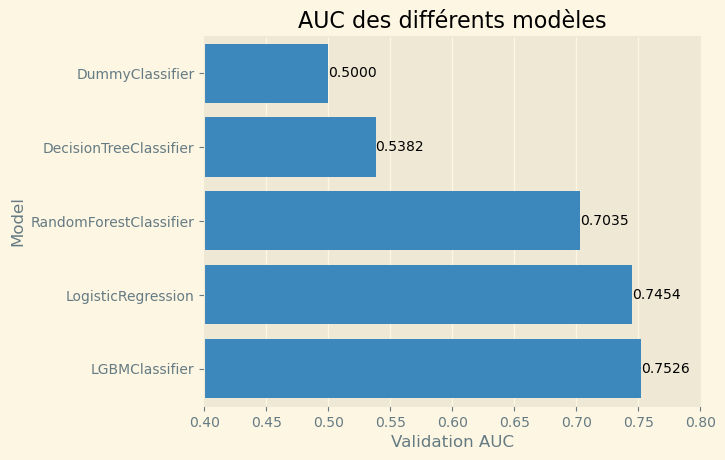

In [ ]:
df_performance_default = df_performance.loc[df_performance['Méthode']== 'sans réglages']
df_performance_default = df_performance_default.sort_values(by='Validation AUC')
plt.style.use('Solarize_Light2')
ax = sns.barplot(data=df_performance_default, x='Validation AUC', y='Model')
ax.bar_label(ax.containers[0], fmt='%.4f')
plt.xlim(0.4, 0.8)
plt.title('AUC des différents modèles')


### GridSearchCV

In [636]:
def try_model_params(X_train, X_test, y_train, y_test, model, param_grid, df_performance):

    grid = GridSearchCV(model(), param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
    grid.fit(X_train, y_train)

    # Meilleur modèle trouvé
    best_model = grid.best_estimator_
    
    # Prédiction
    y_test_pred = best_model.predict(X_test)
    y_test_pred_proba = best_model.predict_proba(X_test)[:, 1]

    # Score sur test
    model_score = best_model.score(X_test, y_test)  
    rappel = recall_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred)
    f1score = f1_score(y_test, y_test_pred)
    test_auc = roc_auc_score(y_test, y_test_pred_proba)
    matrice_confusion = confusion_matrix(y_test, y_test_pred)
    
    
    # Score sur train
    train_auc = roc_auc_score(y_train, best_model.predict_proba(X_train)[:, 1])
    
    print(f'Matrice de confusion {model.__class__.__name__}: {matrice_confusion}')

    
    result = pd.DataFrame([{
        'Model': best_model.__class__.__name__,
        'Best Params': grid.best_params_,
        'Accuracy': model_score,
        'Recall': rappel,
        'Precision': precision,
        'F1 Score': f1score,
        'Train AUC': train_auc,
        'Validation AUC': test_auc,
        'CV ROC AUC': grid.best_score_,
        'Matrice de confusion':matrice_confusion,
        'Méthode': 'correct1 gridsearch'
    
    
    }])

    df_performance = pd.concat([df_performance, result], ignore_index=True)
    
    return df_performance, best_model


#### LogisticRegression

In [ ]:
# Logistic Regression
param_lr = {
    'C': np.logspace(-3, 2, 6), # (0.001, 0.01, 0.1, 1, 10, 100)(-1, 3, 4)
    'solver': ['liblinear'],
    'penalty': ['l1', 'l2'],
    'random_state':[42],
}
model_lr = LogisticRegression
df_performance, model_lr_best = try_model_params(X_train, X_val, y_train, y_val, model_lr, param_lr, df_performance)

Matrice de confusion type: [[49367    50]
 [ 4346    52]]


#### DecisionTree

In [ ]:
param_tree = {
            'max_depth': [3, 5, 8, 12],
            'min_samples_leaf': [2, 5, 10, 20],
            'random_state': [42] 
            }
model_tree = DecisionTreeClassifier 
df_performance, model_tree_best = try_model_params(X_train, X_val, y_train, y_val, model_tree, param_tree, df_performance)

Matrice de confusion ABCMeta: [[49240   177]
 [ 4328    70]]


#### RandomForest

In [ ]:
params_rf = {
    'max_depth': [3, 6, 10],
    'n_estimators': [50, 100, 200],
    'max_features': ['sqrt', 'log2', 0.3], # 15F, 8F et 73F
    'random_state':[42]
}
model_rf = RandomForestClassifier
df_performance, model_rf_best = try_model_params(X_train, X_val, y_train, y_val, model_rf, params_rf, df_performance)

Matrice de confusion ABCMeta: [[49412     5]
 [ 4390     8]]


#### Gardient Boosting

In [ ]:
# Meilleur n_estimators

model_lgbm = lgb.LGBMClassifier
param_lgbm = {
    'learning_rate': np.logspace(-3, 0, 4), # [0.01, 0.1, 1.0]
    'n_estimators': [20, 40, 50, 100],
    'max_depth': [3, 5, 7],
    'reg_alpha': [0, 0.1, 1], 
    'reg_lambda': [0, 0.1, 1], 
    'random_state': [42]
    }
df_performance, model_lgbm_best = try_model_params(X_train, X_val, y_train, y_val, model_lgbm, param_lgbm, df_performance)

[LightGBM] [Info] Number of positive: 10411, number of negative: 118742
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066885 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11709
[LightGBM] [Info] Number of data points in the train set: 129153, number of used features: 230
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080610 -> initscore=-2.434090
[LightGBM] [Info] Start training from score -2.434090
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

/opt/anaconda3/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 13014, number of negative: 148428
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11741
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 231
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080611 -> initscore=-2.434074
[LightGBM] [Info] Start training from score -2.434074
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

In [ ]:
df_performance

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode
0,DummyClassifier,{'strategy': 'uniform'},0.498941,0.495225,0.080840,0.138992,0.500000,0.500000,NaN,"[[24653, 24764], [2220, 2178]]",sans réglages
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.745403,NaN,"[[49372, 45], [4353, 45]]",sans réglages
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.538242,NaN,"[[45129, 4288], [3680, 718]]",sans réglages
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.703476,NaN,"[[49414, 3], [4396, 2]]",sans réglages
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,NaN,"[[49359, 58], [4327, 71]]",sans réglages
5,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.918313,0.011824,0.509804,0.023111,0.749472,0.747904,0.744518,"[[49367, 50], [4346, 52]]",gridsearch
6,DecisionTreeClassifier,"{'max_depth': 8, 'min_samples_leaf': 2, 'rando...",0.916287,0.015916,0.283401,0.030140,0.738189,0.708186,0.708735,"[[49240, 177], [4328, 70]]",gridsearch
7,RandomForestClassifier,"{'max_depth': 10, 'max_features': 0.3, 'n_esti...",0.918331,0.001819,0.615385,0.003627,0.814666,0.737734,0.736693,"[[49412, 5], [4390, 8]]",gridsearch
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.755158,0.753647,"[[49369, 48], [4349, 49]]",gridsearch


In [ ]:
for i in df_performance.index:
    print(f"{df_performance.loc[i, 'Model']} : {df_performance.loc[i, 'Best Params']}")

DummyClassifier : {'strategy': 'uniform'}
LogisticRegression : {'random_state': 42}
DecisionTreeClassifier : {'random_state': 42}
RandomForestClassifier : {'random_state': 42}
LGBMClassifier : {'random_state': 42}
LogisticRegression : {'C': 10.0, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear'}
DecisionTreeClassifier : {'max_depth': 8, 'min_samples_leaf': 2, 'random_state': 42}
RandomForestClassifier : {'max_depth': 10, 'max_features': 0.3, 'n_estimators': 200, 'random_state': 42}
LGBMClassifier : {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'random_state': 42, 'reg_alpha': 0.1, 'reg_lambda': 1}


#### Resultat

In [ ]:
# # ramener la valeur de Validation AUC à seulemtn 4 chiffres apres la virgule pour la visu
# df_greadsearch['Validation AUC'] = df_greadsearch['Validation AUC'].astype(float).round(4)

In [ ]:
df_performance_grid = df_performance.loc[df_performance['Méthode']== 'gridsearch']
auc_sort =df_performance_grid.sort_values(by='Validation AUC')


Text(0.5, 1.0, 'GridSearchCV AUC')

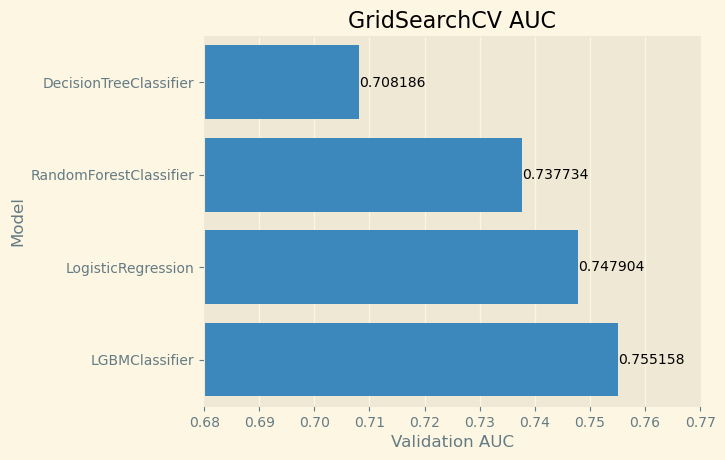

In [ ]:
ax = sns.barplot(data=auc_sort, x= 'Validation AUC', y='Model')
ax.bar_label(ax.containers[0])
plt.xlim(0.68, 0.77)
plt.title('GridSearchCV AUC')

=> Recall, f1_score proche de 0
class_weights pour l'équilibre des classes

### class_weight

#### LogisticRegression

In [ ]:
model_lr = LogisticRegression
params_lr = {'C': 10.0, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear', 'class_weight':'balanced'}

df_performance, model_lr_class_weight_fitted = try_model(X_train, X_val, y_train, y_val, model_lr, params_lr, df_performance)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Matrice de confusion LogisticRegression: [[34121 15296]
 [ 1406  2992]]


/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_1714/795418195.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_performance = pd.concat([df_performance, result], ignore_index=True)


#### DecisionTree

In [ ]:
param_tree = {'max_depth': 8, 'min_samples_leaf': 2, 'random_state': 42, 'class_weight':'balanced'}
model_tree = DecisionTreeClassifier 
df_performance, model_tree_fitt = try_model(X_train, X_val, y_train, y_val, model_tree, param_tree, df_performance)

Matrice de confusion DecisionTreeClassifier: [[33326 16091]
 [ 1578  2820]]


/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_1714/795418195.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_performance = pd.concat([df_performance, result], ignore_index=True)


#### RandomForest

In [ ]:
param_rf = {'max_depth': 10, 'max_features': 0.3, 'n_estimators': 200, 'random_state':42, 'class_weight':'balanced'}
model_rf = RandomForestClassifier
df_performance, model_rf_fitt = try_model(X_train, X_val, y_train, y_val, model_rf, param_rf, df_performance)

Matrice de confusion RandomForestClassifier: [[37942 11475]
 [ 1875  2523]]


/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_1714/795418195.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_performance = pd.concat([df_performance, result], ignore_index=True)


#### LGBMClassifier 

In [ ]:
model_lgbm = lgb.LGBMClassifier
param_lgbm = {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'random_state': 42, 'reg_alpha': 0.1, 'reg_lambda': 1, 'class_weight':'balanced'}
df_performance, model_lgbm_fitt = try_model(X_train, X_val, y_train, y_val, model_lgbm, param_lgbm, df_performance)

[LightGBM] [Info] Number of positive: 13014, number of negative: 148428
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020925 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11741
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 231
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_1714/795418195.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_performance = pd.concat([df_performance, result], ignore_index=True)


#### Resultat

In [ ]:
df_performance

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode
0,DummyClassifier,{'strategy': 'uniform'},0.498941,0.495225,0.080840,0.138992,0.500000,0.500000,NaN,"[[24653, 24764], [2220, 2178]]",sans réglages
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.745403,NaN,"[[49372, 45], [4353, 45]]",sans réglages
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.538242,NaN,"[[45129, 4288], [3680, 718]]",sans réglages
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.703476,NaN,"[[49414, 3], [4396, 2]]",sans réglages
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,NaN,"[[49359, 58], [4327, 71]]",sans réglages
5,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.918313,0.011824,0.509804,0.023111,0.749472,0.747904,0.744518,"[[49367, 50], [4346, 52]]",gridsearch
6,DecisionTreeClassifier,"{'max_depth': 8, 'min_samples_leaf': 2, 'rando...",0.916287,0.015916,0.283401,0.030140,0.738189,0.708186,0.708735,"[[49240, 177], [4328, 70]]",gridsearch
7,RandomForestClassifier,"{'max_depth': 10, 'max_features': 0.3, 'n_esti...",0.918331,0.001819,0.615385,0.003627,0.814666,0.737734,0.736693,"[[49412, 5], [4390, 8]]",gridsearch
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.755158,0.753647,"[[49369, 48], [4349, 49]]",gridsearch
9,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.688706,0.680309,0.163605,0.263775,0.750107,0.747886,NaN,"[[34121, 15296], [1406, 2992]]",class_weight


In [ ]:
df_class_weight	= df_performance.loc[df_performance['Méthode'] == 'class_weight'] # isoler la partie du dataframe pour la visu des performances 

Text(0.5, 1.0, 'class_weight AUC')

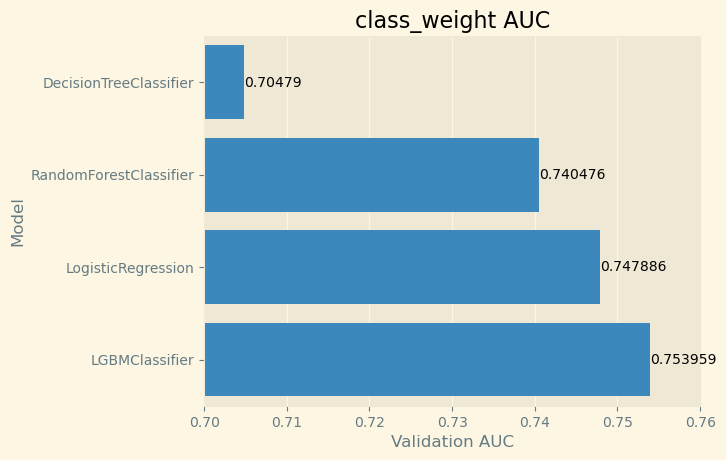

In [ ]:
df_class_F1Score_sort = df_class_weight.sort_values(by='Validation AUC')
ax = sns.barplot(data=df_class_F1Score_sort, x= 'Validation AUC', y='Model')
ax.bar_label(ax.containers[0])
plt.xlim(0.70, 0.76)
plt.title('class_weight AUC')

Text(0.5, 1.0, 'class_weight Recall')

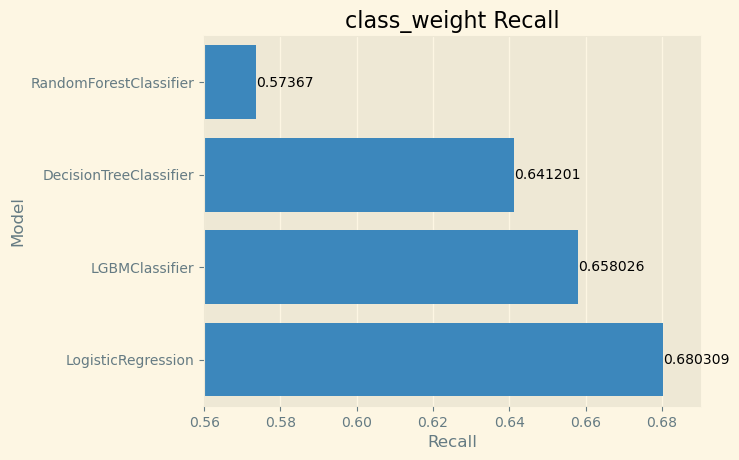

In [ ]:
df_class_Recall_sort = df_class_weight.sort_values(by='Recall')
ax = sns.barplot(data=df_class_Recall_sort, x= 'Recall', y='Model')
ax.bar_label(ax.containers[0])
plt.xlim(0.56, 0.69)
plt.title('class_weight Recall')

Text(0.5, 1.0, 'class_weight F1 Score')

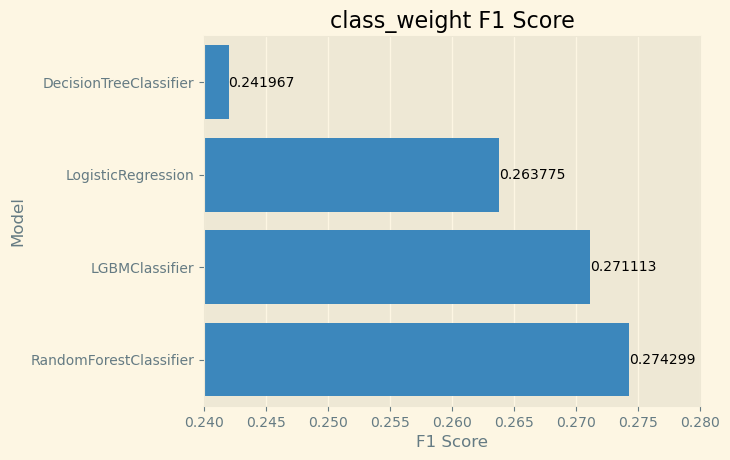

In [ ]:
df_class_F1Score_sort = df_class_weight.sort_values(by='F1 Score')
ax = sns.barplot(data=df_class_F1Score_sort, x= 'F1 Score', y='Model')
ax.bar_label(ax.containers[0])
plt.xlim(0.24, 0.28)
plt.title('class_weight F1 Score')

Text(0.5, 1.0, 'class_weight AUC')

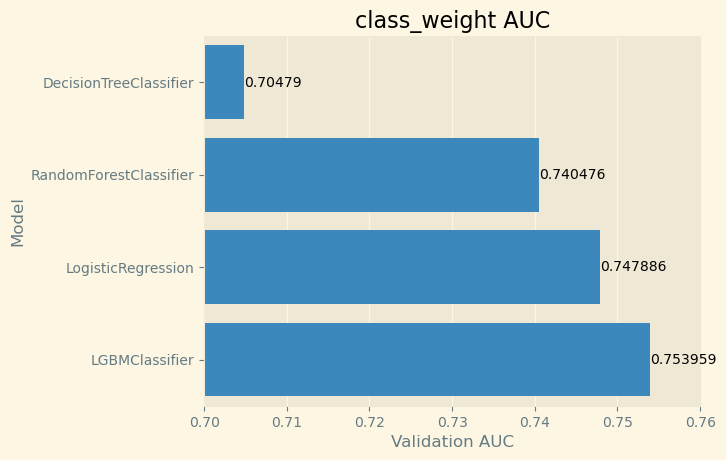

In [ ]:
df_class_auc_sort = df_class_weight.sort_values(by='Validation AUC')
ax = sns.barplot(data=df_class_auc_sort, x= 'Validation AUC', y='Model')
ax.bar_label(ax.containers[0])
plt.xlim(0.70, 0.76)
plt.title('class_weight AUC')

#### Exemple modèle kaggle

In [ ]:
# Test hyperparametre d'un exemple kaggle
model_lgbm_kaggle = lgb.LGBMClassifier
params_lgbm_kaggle = {
'n_estimators':10000,
'learning_rate':0.02,
'num_leaves':34,
'colsample_bytree':0.95,
'subsample':0.87,
'max_depth':8,
'reg_alpha':0.04,
'reg_lambda':0.07,
'min_split_gain':0.02,
'min_child_weight':39,
'silent':-1,
'verbose':-1,
'random_state':42
}
df_performance,  model_lgbm_kaggle_fitted= try_model(X_train, X_val, y_train, y_val, model_lgbm_kaggle, params_lgbm_kaggle, df_performance) 

Matrice de confusion LGBMClassifier: [[49183   234]
 [ 4216   182]]


/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_1714/795418195.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_performance = pd.concat([df_performance, result], ignore_index=True)


In [ ]:
df_performance

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode,F-beta Score
0,DummyClassifier,{'strategy': 'uniform'},0.500155,0.491132,0.080899,0.138916,0.500000,0.500000,NaN,[[24877 24540]\n [ 2238 2160]],sans réglages,NaN
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.745403,NaN,[[49372 45]\n [ 4353 45]],sans réglages,NaN
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.538242,NaN,[[45129 4288]\n [ 3680 718]],sans réglages,NaN
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.703476,NaN,[[49414 3]\n [ 4396 2]],sans réglages,NaN
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,NaN,[[49359 58]\n [ 4327 71]],sans réglages,NaN
5,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.918313,0.011824,0.509804,0.023111,0.749472,0.747904,0.744518,[[49367 50]\n [ 4346 52]],gridsearch,NaN
6,DecisionTreeClassifier,"{'max_depth': 8, 'min_samples_leaf': 2, 'rando...",0.916287,0.015916,0.283401,0.030140,0.738189,0.708186,0.708735,[[49240 177]\n [ 4328 70]],gridsearch,NaN
7,RandomForestClassifier,"{'max_depth': 10, 'max_features': 0.3, 'n_esti...",0.918331,0.001819,0.615385,0.003627,0.814666,0.737734,0.736693,[[49412 5]\n [ 4390 8]],gridsearch,NaN
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.755158,0.753647,[[49369 48]\n [ 4349 49]],gridsearch,NaN
9,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.688706,0.680309,0.163605,0.263775,0.750107,0.747886,NaN,[[34121 15296]\n [ 1406 2992]],class_weight,NaN


=> overfitting pour ce modèle (Train AUC = 0.974186 et auc = 0.732623)

=> Modèles retenus:
LogisticRegression & LGBMClassifier

### Feature engineering

#### F1 ratio_annuity_income

AMT_INCOME_TOTAL = AMT_ANNUITY/AMT_INCOME_TOTAL

In [313]:
df_train.shape

(215257, 244)

In [314]:
df_train['AMT_INCOME_TOTAL'].describe()

count    215257.000000
mean          0.001222
std           0.000905
min           0.000000
25%           0.000742
50%           0.001012
75%           0.001512
max           0.115191
Name: AMT_INCOME_TOTAL, dtype: float64

Présence de 0 dans la varible df_train['AMT_INCOME_TOTAL'] qui sera utilisée comme dénominateur 

In [315]:
df_train['ratio_annuity_income'] = np.where( # np.where(condition, A, B)
    df_train['AMT_INCOME_TOTAL'] != 0, 
    df_train['AMT_ANNUITY']  / df_train['AMT_INCOME_TOTAL'],0
)


df_test['ratio_annuity_income']   = np.where( # np.where(condition, A, B)
    df_test['AMT_INCOME_TOTAL']  != 0,
    df_test['AMT_ANNUITY']  / df_test['AMT_INCOME_TOTAL'], 0
)

In [316]:
df_train[['AMT_ANNUITY', 'AMT_INCOME_TOTAL', 'ratio_annuity_income']].describe()

,AMT_ANNUITY,AMT_INCOME_TOTAL,ratio_annuity_income
count,215257.000000,215257.000000,215257.000000
mean,0.099466,0.001222,101.837982
std,0.056635,0.000905,102.644813
min,0.000000,0.000000,0.000000
25%,0.058073,0.000742,56.883752
50%,0.090821,0.001012,84.742060
75%,0.128835,0.001512,125.087212
max,1.000000,0.115191,10381.600918


In [317]:
corr = df_train['ratio_annuity_income'].corr(df_train['TARGET'])
corr

0.009198356230097928

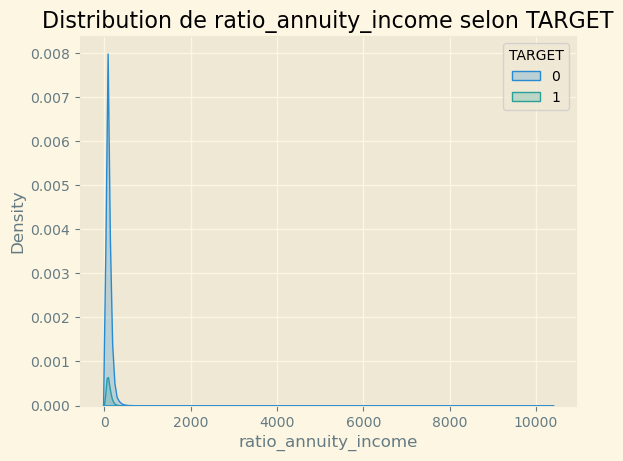

In [318]:
sns.kdeplot(x=df_train['ratio_annuity_income'], hue=df_train['TARGET'], fill=True)
plt.title('Distribution de ratio_annuity_income selon TARGET')
plt.show()

#### F2 ratio_credit_annuity

AMT_ANNUITY = AMT_CREDIT/AMT_ANNUITY

In [319]:
df_train['AMT_ANNUITY'].describe()

count    215257.000000
mean          0.099466
std           0.056635
min           0.000000
25%           0.058073
50%           0.090821
75%           0.128835
max           1.000000
Name: AMT_ANNUITY, dtype: float64

In [320]:
# credit total/mensualité avec ajustement du dénominateur = 0
# credit_annuity_ratio = AMT_CREDIT / AMT_ANNUITY

df_train['ratio_credit_annuity']  = np.where(
    df_train['AMT_ANNUITY'] != 0,
    df_train['AMT_CREDIT'] / df_train['AMT_ANNUITY'],
    0
)
df_test['ratio_credit_annuity']  = np.where(
    df_test['AMT_ANNUITY'] != 0,
    df_test['AMT_CREDIT'] / df_test['AMT_ANNUITY'],
    0
)


In [321]:
df_train[['AMT_CREDIT', 'AMT_ANNUITY', 'ratio_credit_annuity']].describe()


,AMT_CREDIT,AMT_ANNUITY,ratio_credit_annuity
count,215257.000000,215257.000000,215257.000000
mean,0.138451,0.099466,1.341193
std,0.100599,0.056635,0.549690
min,0.000000,0.000000,0.000000
25%,0.056180,0.058073,0.940592
50%,0.117320,0.090821,1.241548
75%,0.190674,0.128835,1.732241
max,1.000000,1.000000,3.069202


In [322]:
corr = df_train['ratio_credit_annuity'].corr(df_train['TARGET'])
corr

-0.031986083913496645

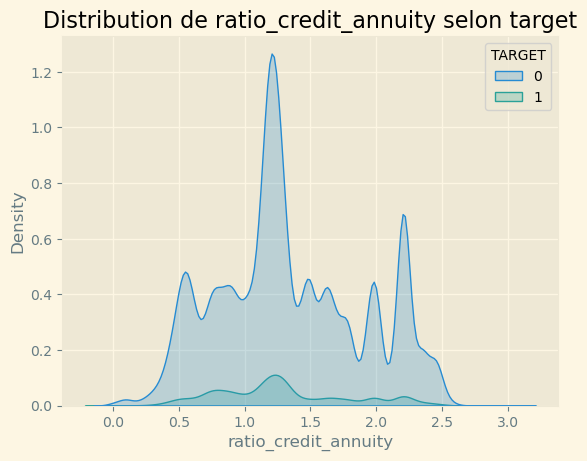

In [323]:
sns.kdeplot(x=df_train['ratio_credit_annuity'], hue=df_train['TARGET'], fill=True)
plt.title('Distribution de ratio_credit_annuity selon target')
plt.show()


#### F3 ratio_credit_goods_price

credit_goods_price_ratio = AMT_CREDIT/ AMT_GOODS_PRICE

In [324]:
df_train['AMT_GOODS_PRICE'].describe()

count    215257.000000
mean          0.124266
std           0.092195
min           0.000000
25%           0.049383
50%           0.102132
75%           0.159371
max           1.000000
Name: AMT_GOODS_PRICE, dtype: float64

In [325]:
df_train['ratio_credit_goods_price'] = np.where(
    df_train['AMT_GOODS_PRICE'] != 0,
    df_train['AMT_CREDIT'] / df_train['AMT_GOODS_PRICE'],
    0
)
df_test['ratio_credit_goods_price'] = np.where(
    df_test['AMT_GOODS_PRICE'] != 0,
   df_test['AMT_CREDIT'] / df_test['AMT_GOODS_PRICE'],
    0
)

In [326]:
df_train['ratio_credit_goods_price'].describe()

count    215257.000000
mean          1.126902
std           0.195313
min           0.000000
25%           0.994023
50%           1.120518
75%           1.205816
max          50.056180
Name: ratio_credit_goods_price, dtype: float64

In [327]:
corr = df_train['ratio_credit_goods_price'].corr(df_train['TARGET'])
corr

0.050224776384659255

Text(0.5, 1.0, 'Distribution de ratio_credit_goods_price selon target')

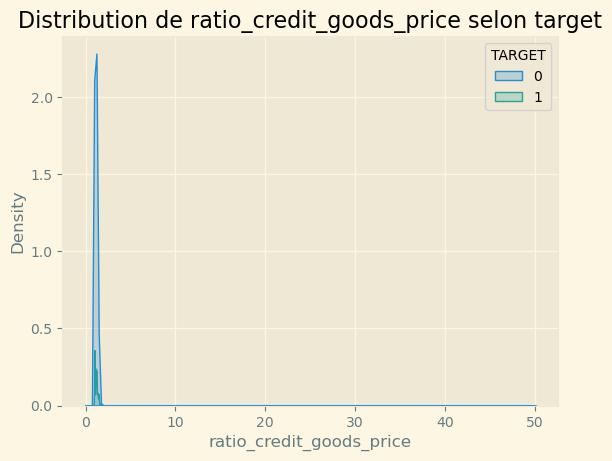

In [328]:
sns.kdeplot(x=df_train['ratio_credit_goods_price'], hue=df_train['TARGET'], fill=True)
plt.title('Distribution de ratio_credit_goods_price selon target')


#### F4 ratio_work_age

ratio_work_age = DAYS_EMPLOYED/DAYS_BIRTH

In [329]:
df_train['ratio_work_age'] = np.where(
    df_train['DAYS_BIRTH'] == 0,     # Condition : si l'âge est 0
    0,                       # Alors on met 0 (évite division par zéro)
    df_train['DAYS_EMPLOYED'] / df_train['DAYS_BIRTH']  # Sinon, calcul 
)
df_test['ratio_work_age'] = np.where(
    df_test['DAYS_BIRTH'] == 0, 
    0, 
    df_test['DAYS_EMPLOYED'] / df_test['DAYS_BIRTH']
)

In [330]:
df_train[['DAYS_EMPLOYED', 'DAYS_BIRTH', 'ratio_work_age']].describe()

,DAYS_EMPLOYED,DAYS_BIRTH,ratio_work_age
count,215257.000000,215257.000000,215257.000000
mean,0.874306,0.481632,3.127401
std,0.119365,0.245877,4.690053
min,0.000000,0.000000,0.000000
25%,0.845913,0.277396,1.224127
50%,0.907995,0.465614,1.851261
75%,0.948024,0.687260,3.232218
max,1.000000,1.000000,93.902394


In [331]:
corr = df_train['ratio_work_age'].corr(df_train['TARGET'])
corr

0.049317102947092864

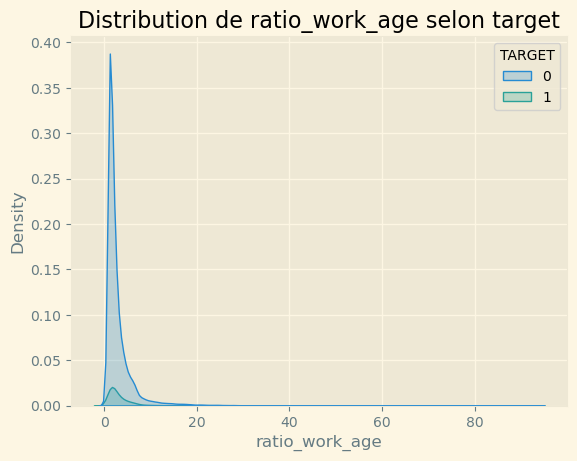

In [332]:
sns.kdeplot(x=df_train['ratio_work_age'], hue=df_train['TARGET'], fill=True)
plt.title('Distribution de ratio_work_age selon target')
plt.show()


In [333]:
df_train.shape[1]

248

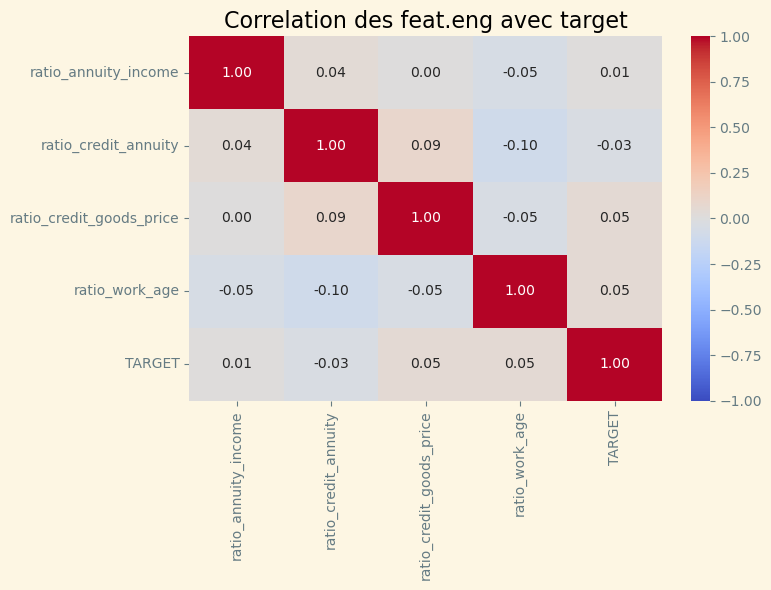

In [334]:

# Sélectionner sur les nouvelles feat + target
feat_engi_target = df_train[['ratio_annuity_income', 'ratio_credit_annuity', 'ratio_credit_goods_price', 'ratio_work_age', 'TARGET']]

# Corrélation
corr = feat_engi_target.corr()

# Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title("Correlation des feat.eng avec target")
plt.tight_layout()
plt.show()


Evaluation des modèles sur le dataset augmenté :

In [335]:
# Séparer df_train en trainning et validation avec les nouvelles features
X = df_train.drop(columns=['TARGET'])

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

#### LogisticRegression

In [ ]:
model_lr_f_e = LogisticRegression
params_lr_f_e = {'C': 10.0, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear','class_weight':'balanced', 'max_iter':1000} 
    
df_performance, model_lr_f_e_fitted = try_model(X_train, X_val, y_train, y_val, model_lr_f_e, params_lr_f_e, df_performance)

Matrice de confusion LogisticRegression: [[34187 15230]
 [ 1422  2976]]


/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_40721/1825201256.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_performance = pd.concat([df_performance, result], ignore_index=True)


In [54]:
df_performance 

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode,F-beta Score
0,DummyClassifier,{'strategy': 'uniform'},0.500155,0.491132,0.080899,0.138916,0.500000,0.500000,NaN,[[24877 24540]\n [ 2238 2160]],sans réglages,NaN
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.745403,NaN,[[49372 45]\n [ 4353 45]],sans réglages,NaN
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.538242,NaN,[[45129 4288]\n [ 3680 718]],sans réglages,NaN
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.703476,NaN,[[49414 3]\n [ 4396 2]],sans réglages,NaN
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,NaN,[[49359 58]\n [ 4327 71]],sans réglages,NaN
5,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.918313,0.011824,0.509804,0.023111,0.749472,0.747904,0.744518,[[49367 50]\n [ 4346 52]],gridsearch,NaN
6,DecisionTreeClassifier,"{'max_depth': 8, 'min_samples_leaf': 2, 'rando...",0.916287,0.015916,0.283401,0.030140,0.738189,0.708186,0.708735,[[49240 177]\n [ 4328 70]],gridsearch,NaN
7,RandomForestClassifier,"{'max_depth': 10, 'max_features': 0.3, 'n_esti...",0.918331,0.001819,0.615385,0.003627,0.814666,0.737734,0.736693,[[49412 5]\n [ 4390 8]],gridsearch,NaN
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.755158,0.753647,[[49369 48]\n [ 4349 49]],gridsearch,NaN
9,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.688706,0.680309,0.163605,0.263775,0.750107,0.747886,NaN,[[34121 15296]\n [ 1406 2992]],class_weight,NaN


#### LightGBM

In [283]:
# lightGBM
model_lgbm_f_e = lgb.LGBMClassifier
param_lgbm_f_e = {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'random_state': 42, 'reg_alpha': 0.1, 'reg_lambda': 1, 'class_weight': 'balanced'}
df_performance, model_lgbm_f_e_fitted = try_model(X_train, X_val, y_train, y_val, model_lgbm_f_e, param_lgbm_f_e, df_performance) 

[LightGBM] [Info] Number of positive: 13014, number of negative: 148428
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12761
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 235
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_40721/3854672596.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_performance = pd.concat([df_performance, result], ignore_index=True)


In [ ]:
df_performance

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode,F-beta Score
0,DummyClassifier,{'strategy': 'uniform'},0.500155,0.491132,0.080899,0.138916,0.500000,0.5,NaN,[[24877 24540]\n [ 2238 2160]],sans réglages,NaN
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.7454028846748724,NaN,[[49372 45]\n [ 4353 45]],sans réglages,NaN
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.5382421333798015,NaN,[[45129 4288]\n [ 3680 718]],sans réglages,NaN
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.7034760919414507,NaN,[[49414 3]\n [ 4396 2]],sans réglages,NaN
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.7526458506182082,NaN,[[49359 58]\n [ 4327 71]],sans réglages,NaN
5,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.918313,0.011824,0.509804,0.023111,0.749472,0.7479035154264343,0.744518,[[49367 50]\n [ 4346 52]],gridsearch,NaN
6,DecisionTreeClassifier,"{'max_depth': 8, 'min_samples_leaf': 2, 'rando...",0.916287,0.015916,0.283401,0.030140,0.738189,0.7081856805973843,0.708735,[[49240 177]\n [ 4328 70]],gridsearch,NaN
7,RandomForestClassifier,"{'max_depth': 10, 'max_features': 0.3, 'n_esti...",0.918331,0.001819,0.615385,0.003627,0.814666,0.7377339699035363,0.736693,[[49412 5]\n [ 4390 8]],gridsearch,NaN
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.7551578002510637,0.753647,[[49369 48]\n [ 4349 49]],gridsearch,NaN
9,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.688706,0.680309,0.163605,0.263775,0.750107,0.7478856582807836,NaN,[[34121 15296]\n [ 1406 2992]],class_weight,NaN


*** Tester les performances pour LogisticRegression sans la feature ratio_work_age ***

In [336]:
# Supprimer df_train['ratio_work_age'] 
df_train = df_train.drop(columns='ratio_work_age') 

In [337]:
df_train.shape[1]

247

In [338]:

# Re split du dataset
X = df_train.drop(columns=['TARGET'])

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

In [ ]:
model_lr_f_e = LogisticRegression 
params_lr_f_e = {'C': 10.0, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear','class_weight':'balanced'}
    
df_performance, model_lr_f_e_fitted_2 = try_model(X_train, X_val, y_train, y_val, model_lr_f_e, params_lr_f_e, df_performance) # Modéle sans la feature 'ratio_work_age' => baisse de perf:

# => Recréation de cette variable pour revenir à la totalité des features


/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Matrice de confusion LogisticRegression: [[34158 15259]
 [ 1426  2972]]


/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_88470/2943847387.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_performance = pd.concat([df_performance, result], ignore_index=True)


### Top features

#### LogisticRegression

Text(0.5, 1.0, 'Top 30 Features - Logistic Regression')

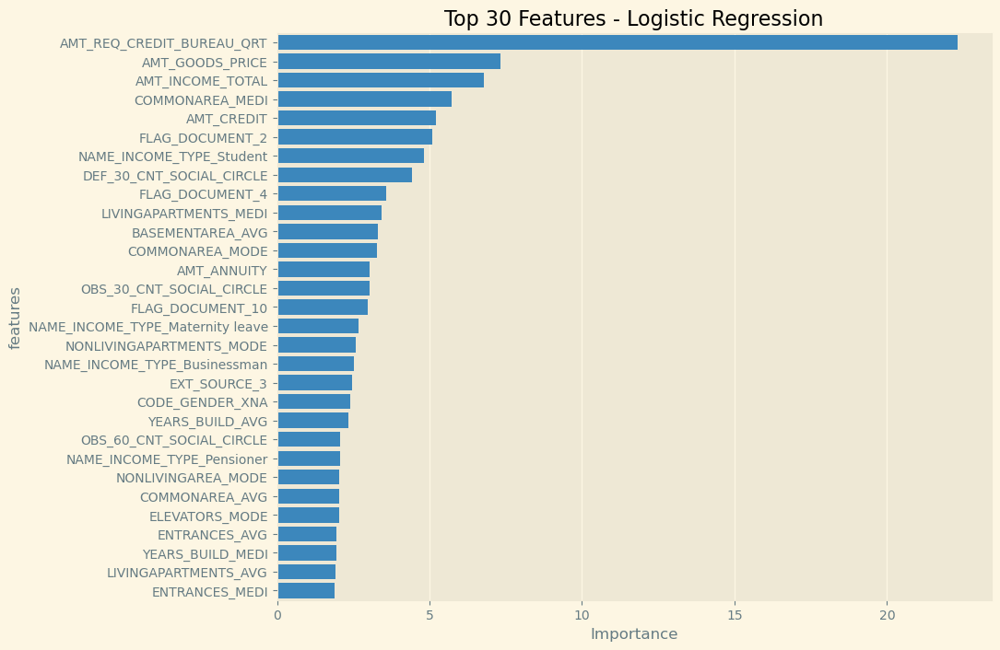

In [204]:
importances = abs(model_lr_f_e_fitted.coef_[0]) #  coefficients du modèle
features_names = X_train.columns

df_feature_importance = pd.DataFrame({
    'features': features_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(data=df_feature_importance.head(30), x='Importance', y='features')
plt.title('Top 30 Features - Logistic Regression')


In [169]:
# Création du sélecteur 
selector = SelectFromModel(model_lr_f_e_fitted, threshold='median', prefit=True)

In [171]:
# Réduction des features
X_train_reduced_lr = selector.transform(X_train)
X_val_reduced_lr = selector.transform(X_val)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


In [173]:
selected_features = features_names[selector.get_support()]
print("Features sélectionnées :", list(selected_features))


Features sélectionnées : ['FLAG_OWN_CAR', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ENTRANCES_AVG', 'FLOORSMIN_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMM

In [ ]:
features_creees = [
    'ratio_annuity_income',
    'ratio_credit_annuity',
    'ratio_credit_goods_price',
    'ratio_work_age'
]

for feat in features_creees:
    if feat in selected_features:
     print(feat)


ratio_credit_goods_price


=> La seule feature issue du feature engineering qui a été retenue est ratio_credit_goods_price

In [58]:
X_train.shape[1], X_train_reduced_lr.shape[1]

(247, 124)

In [ ]:
# Performance du modéle avec les feat. reduites
model_lr = LogisticRegression
params_lr = {'C': 10.0, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear','class_weight':'balanced'}
df_performance, model_lr_f_e_reduced_fitted = try_model(X_train_reduced_lr, X_val_reduced_lr, y_train, y_val, model_lr, params_lr, df_performance)


Matrice de confusion LogisticRegression: [[34057 15360]
 [ 1429  2969]]


/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_40721/3854672596.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_performance = pd.concat([df_performance, result], ignore_index=True)


In [120]:
df_performance

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode,F-beta Score
0,DummyClassifier,{'strategy': 'uniform'},0.500155,0.491132,0.080899,0.138916,0.500000,0.500000,NaN,[[24877 24540]\n [ 2238 2160]],sans réglages,NaN
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.745403,NaN,[[49372 45]\n [ 4353 45]],sans réglages,NaN
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.538242,NaN,[[45129 4288]\n [ 3680 718]],sans réglages,NaN
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.703476,NaN,[[49414 3]\n [ 4396 2]],sans réglages,NaN
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,NaN,[[49359 58]\n [ 4327 71]],sans réglages,NaN
5,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.918313,0.011824,0.509804,0.023111,0.749472,0.747904,0.744518,[[49367 50]\n [ 4346 52]],gridsearch,NaN
6,DecisionTreeClassifier,"{'max_depth': 8, 'min_samples_leaf': 2, 'rando...",0.916287,0.015916,0.283401,0.030140,0.738189,0.708186,0.708735,[[49240 177]\n [ 4328 70]],gridsearch,NaN
7,RandomForestClassifier,"{'max_depth': 10, 'max_features': 0.3, 'n_esti...",0.918331,0.001819,0.615385,0.003627,0.814666,0.737734,0.736693,[[49412 5]\n [ 4390 8]],gridsearch,NaN
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.755158,0.753647,[[49369 48]\n [ 4349 49]],gridsearch,NaN
9,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.688706,0.680309,0.163605,0.263775,0.750107,0.747886,NaN,[[34121 15296]\n [ 1406 2992]],class_weight,NaN


#### LightGBM

In [287]:
# Récup features important 
importances = model_lgbm_f_e_fitted.feature_importances_
features_names = X_train.columns 

df_importance_features = pd.DataFrame({   
        'features': features_names,
        'Importance':importances
        }).sort_values(by='Importance', ascending=False)


In [288]:
# Récup features important 
importances = model_lgbm_f_e_fitted.feature_importances_
features_names = X_train.columns 

df_importance_features = pd.DataFrame({   
        'features': features_names,
        'Importance':importances
        }).sort_values(by='Importance', ascending=False)


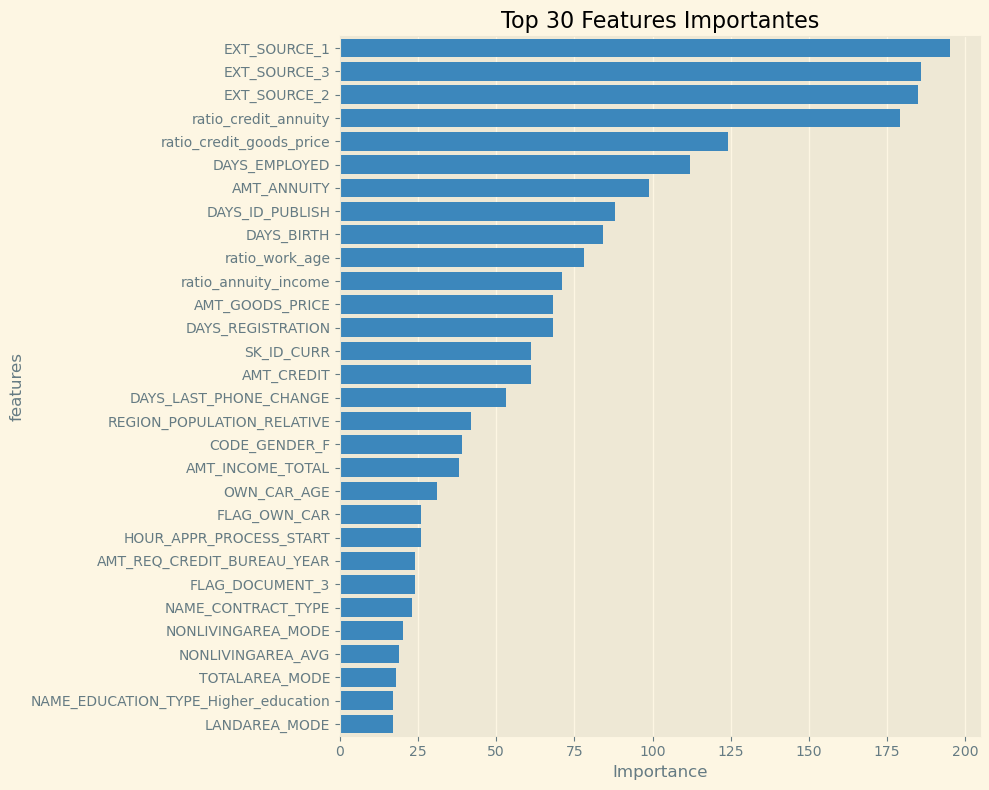

In [289]:

plt.figure(figsize=(10, 8))
sns.barplot(data=df_importance_features.head(30), x='Importance', y='features')
plt.title('Top 30 Features Importantes')
plt.tight_layout()
plt.show()


In [290]:
# Création du sélecteur 
selector = SelectFromModel(model_lgbm_f_e_fitted, threshold='median', # Garder features dont l'importance > 50%
                           prefit=True)


In [ ]:
# Préparer la troisième partie des données jamais utiliser pour le test final 
X_test= df_test.drop(columns=['TARGET'])

In [293]:
# Réduction des features
X_train_reduced_lgbm = selector.transform(X_train)
X_val_reduced_lgbm = selector.transform(X_val)
X_test_reduced = selector.transform(X_test)


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


In [235]:
X_train.shape[1], X_train_reduced_lgbm.shape[1]


(247, 134)

In [236]:
# lightGBM
model_lgbm = lgb.LGBMClassifier
param_lgbm = {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'random_state': 42, 'reg_alpha': 0.1, 'reg_lambda': 1, 'class_weight':'balanced'}
df_performance, model_lgbm_f_e_reduced_fitted = try_model(X_train_reduced_lgbm, X_val_reduced_lgbm, y_train, y_val, model_lgbm, param_lgbm, df_performance)

[LightGBM] [Info] Number of positive: 13014, number of negative: 148428
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12285
[LightGBM] [Info] Number of data points in the train set: 161442, number of used features: 134
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_1112/1230306136.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_performance = pd.concat([df_performance, result], ignore_index=True)


#### Resultat

In [344]:
df_performance

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode,F-beta Score
0,DummyClassifier,{'strategy': 'uniform'},0.500155,0.491132,0.080899,0.138916,0.500000,0.500000,NaN,[[24877 24540]\n [ 2238 2160]],sans réglages,NaN
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.745403,NaN,[[49372 45]\n [ 4353 45]],sans réglages,NaN
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.538242,NaN,[[45129 4288]\n [ 3680 718]],sans réglages,NaN
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.703476,NaN,[[49414 3]\n [ 4396 2]],sans réglages,NaN
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,NaN,[[49359 58]\n [ 4327 71]],sans réglages,NaN
5,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.918313,0.011824,0.509804,0.023111,0.749472,0.747904,0.744518,[[49367 50]\n [ 4346 52]],gridsearch,NaN
6,DecisionTreeClassifier,"{'max_depth': 8, 'min_samples_leaf': 2, 'rando...",0.916287,0.015916,0.283401,0.030140,0.738189,0.708186,0.708735,[[49240 177]\n [ 4328 70]],gridsearch,NaN
7,RandomForestClassifier,"{'max_depth': 10, 'max_features': 0.3, 'n_esti...",0.918331,0.001819,0.615385,0.003627,0.814666,0.737734,0.736693,[[49412 5]\n [ 4390 8]],gridsearch,NaN
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.755158,0.753647,[[49369 48]\n [ 4349 49]],gridsearch,NaN
9,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.688706,0.680309,0.163605,0.263775,0.750107,0.747886,NaN,[[34121 15296]\n [ 1406 2992]],class_weight,NaN


 #### Conclusion
 LogisticRegression = Perte minime de performances
 
 LightGBM = Performances identiques

### Metriques metier

In [296]:
from sklearn.metrics import f1_score as sk_f1_score
def try_model_params_fbeta(X_train, X_test, y_train, y_test, model, param_grid, df_performance):
    
    fbeta_scorer = make_scorer(fbeta_score, beta=2) # beta=2 > 1 => privilégie le rappel

    grid = GridSearchCV(model(), param_grid, cv=5, scoring=fbeta_scorer, n_jobs=-1)
    grid.fit(X_train, y_train)

    # Meilleur modèle trouvé
    best_model = grid.best_estimator_
    
    # Prédiction
    y_test_pred = best_model.predict(X_test)
    y_test_pred_proba = best_model.predict_proba(X_test)[:, 1]

    # Score sur test
    model_score = best_model.score(X_test, y_test)  
    rappel = recall_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred)
    f1score = sk_f1_score(y_test, y_test_pred)
    test_auc = roc_auc_score(y_test, y_test_pred_proba)
    matrice_confusion = confusion_matrix(y_test, y_test_pred)
    
    
    # Score sur train
    train_auc = roc_auc_score(y_train, best_model.predict_proba(X_train)[:, 1])
    
    # Métrique perso
    fbeta = fbeta_score(y_test, y_test_pred, beta=2)
       
    result = pd.DataFrame([{
        'Model': best_model.__class__.__name__,
        'Best Params': grid.best_params_,
        'Accuracy': model_score,
        'Recall': rappel,
        'Precision': precision,
        'F1 Score': f1score,
        'Train AUC': train_auc,
        'Validation AUC': test_auc,
        'CV ROC AUC': grid.best_score_,
        'Matrice de confusion':matrice_confusion,
        'F-beta Score': fbeta,
        'Méthode': 'last correct'
    
    
    }])

    df_performance = pd.concat([df_performance, result], ignore_index=True)
    
    return df_performance, best_model


#### LogisticRegression

In [ ]:
# Logistic Regression
param_lr = {
    'C': np.logspace(-1, 3, 4), # (0.1, 1, 100, 1000)
    'solver': ['liblinear'],
    'penalty': ['l1', 'l2'],
    'random_state':[42], 
    'class_weight': ['balanced'],
    'max_iter': [1000]
}

model_lr_fbeta = LogisticRegression
df_performance, model_lr_fbeta_fitt = try_model_params_fbeta(X_train_reduced_lr, X_val_reduced_lr, y_train, y_val, model_lr_fbeta, param_lr, df_performance)


In [379]:
df_performance

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode,F-beta Score
0,DummyClassifier,{'strategy': 'uniform'},0.500155,0.491132,0.080899,0.138916,0.500000,0.500000,NaN,[[24877 24540]\n [ 2238 2160]],sans réglages,NaN
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.745403,NaN,[[49372 45]\n [ 4353 45]],sans réglages,NaN
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.538242,NaN,[[45129 4288]\n [ 3680 718]],sans réglages,NaN
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.703476,NaN,[[49414 3]\n [ 4396 2]],sans réglages,NaN
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,NaN,[[49359 58]\n [ 4327 71]],sans réglages,NaN
5,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.918313,0.011824,0.509804,0.023111,0.749472,0.747904,0.744518,[[49367 50]\n [ 4346 52]],gridsearch,NaN
6,DecisionTreeClassifier,"{'max_depth': 8, 'min_samples_leaf': 2, 'rando...",0.916287,0.015916,0.283401,0.030140,0.738189,0.708186,0.708735,[[49240 177]\n [ 4328 70]],gridsearch,NaN
7,RandomForestClassifier,"{'max_depth': 10, 'max_features': 0.3, 'n_esti...",0.918331,0.001819,0.615385,0.003627,0.814666,0.737734,0.736693,[[49412 5]\n [ 4390 8]],gridsearch,NaN
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.755158,0.753647,[[49369 48]\n [ 4349 49]],gridsearch,NaN
9,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.688706,0.680309,0.163605,0.263775,0.750107,0.747886,NaN,[[34121 15296]\n [ 1406 2992]],class_weight,NaN


In [361]:
df_performance.loc[19, 'Best Params']


"{'C': 2.1544346900318834, 'class_weight': 'balanced', 'max_iter': 1000, 'penalty': 'l1', 'random_state': 42, 'solver': 'liblinear'}"

#### LigthGBM

In [ ]:
# Lightgbm

model_lgbm_fbeta = lgb.LGBMClassifier
param_lgbm_fbeta = {
    'learning_rate': np.logspace(-3, 0, 4), 
    'n_estimators': [20, 40, 50, 100],
    'max_depth': [3, 5, 7],
    'reg_alpha': [0, 0.1, 1], 
    'reg_lambda': [0, 0.1, 1], 
    'random_state': [42],
    'class_weight': ['balanced']
    }
df_performance, model_lgbm_fbeta_fitted = try_model_params_fbeta(X_train_reduced_lgbm, X_val_reduced_lgbm, y_train, y_val, model_lgbm_fbeta, param_lgbm_fbeta, df_performance)

[LightGBM] [Info] Number of positive: 10411, number of negative: 118743
[LightGBM] [Info] Number of positive: 10412, number of negative: 118742
[LightGBM] [Info] Number of positive: 10411, number of negative: 118742
[LightGBM] [Info] Number of positive: 10411, number of negative: 118742
[LightGBM] [Info] Number of positive: 10412, number of negative: 118742
[LightGBM] [Info] Number of positive: 10411, number of negative: 118743
[LightGBM] [Info] Number of positive: 10411, number of negative: 118742
[LightGBM] [Info] Number of positive: 10411, number of negative: 118742
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.079701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12269
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.084725 seconds.
You can set `force_row_wise=true` to remove the overhead.
A

In [327]:
model_lgbm_fbeta_fitted

LGBMClassifier(class_weight='balanced', max_depth=7, random_state=42,
               reg_alpha=1, reg_lambda=0.1)

In [375]:
df_performance

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode,F-beta Score
0,DummyClassifier,{'strategy': 'uniform'},0.500155,0.491132,0.080899,0.138916,0.500000,0.500000,NaN,[[24877 24540]\n [ 2238 2160]],sans réglages,NaN
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.745403,NaN,[[49372 45]\n [ 4353 45]],sans réglages,NaN
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.538242,NaN,[[45129 4288]\n [ 3680 718]],sans réglages,NaN
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.703476,NaN,[[49414 3]\n [ 4396 2]],sans réglages,NaN
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,NaN,[[49359 58]\n [ 4327 71]],sans réglages,NaN
5,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.918313,0.011824,0.509804,0.023111,0.749472,0.747904,0.744518,[[49367 50]\n [ 4346 52]],gridsearch,NaN
6,DecisionTreeClassifier,"{'max_depth': 8, 'min_samples_leaf': 2, 'rando...",0.916287,0.015916,0.283401,0.030140,0.738189,0.708186,0.708735,[[49240 177]\n [ 4328 70]],gridsearch,NaN
7,RandomForestClassifier,"{'max_depth': 10, 'max_features': 0.3, 'n_esti...",0.918331,0.001819,0.615385,0.003627,0.814666,0.737734,0.736693,[[49412 5]\n [ 4390 8]],gridsearch,NaN
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.755158,0.753647,[[49369 48]\n [ 4349 49]],gridsearch,NaN
9,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.688706,0.680309,0.163605,0.263775,0.750107,0.747886,NaN,[[34121 15296]\n [ 1406 2992]],class_weight,NaN


In [381]:
df_performance.loc[20, 'Best Params']

"{'class_weight': 'balanced', 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'random_state': 42, 'reg_alpha': 1, 'reg_lambda': 0.1}"

=> Modèle retenu LightGBM

In [ ]:
# # Sauvegarde du modèle model_lgbm_fbeta_fitted avec joblib
# joblib.dump(model_lgbm_fbeta_fitted, "model_lgbm_fbeta_fitted.pkl")

['model_lgbm_fbeta_fitted_2_.pkl']

In [ ]:
# Charger le modèle sauvegardé
# model_lgbm_fbeta_fitted = joblib.load("model_lgbm_fbeta_fitted_2.pkl")


## seuil_optimal

Prédiction avec le modèle retenu 'model_lgbm_fbeta_fitted'

In [332]:
# prédiction pour récuperer predict_proba
y_val_prob = model_lgbm_fbeta_fitted.predict_proba(X_val_reduced_lgbm) 
y_val_prob 

array([[0.72712877, 0.27287123],
       [0.55910427, 0.44089573],
       [0.13460402, 0.86539598],
       ...,
       [0.8363579 , 0.1636421 ],
       [0.48847127, 0.51152873],
       [0.61640503, 0.38359497]])

In [333]:
y_val_prob = y_val_prob[:, 1] # pour la classe 1
y_val_prob

array([0.27287123, 0.44089573, 0.86539598, ..., 0.1636421 , 0.51152873,
       0.38359497])

Text(0.5, 1.0, 'Distribution de la probabilté de la prediction')

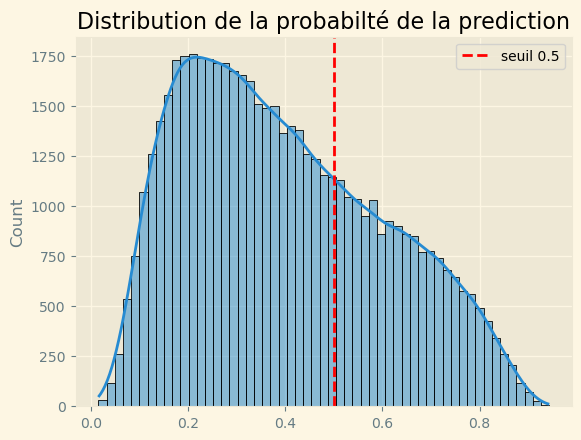

In [334]:
sns.histplot(x=y_val_prob, fill= True, kde=True)
plt.axvline(0.5, color='red', linestyle='--', label='seuil 0.5') # seuil par defaut
plt.legend()
plt.title('Distribution de la probabilté de la prediction')

Recherche du seuil optimal

In [335]:
# test seuil entre 0 et 1
seuils = np.arange(0, 1.01, 0.01)

resultats = []

for seuil in seuils:
    y_pred = (y_val_prob > seuil).astype(int)
    
    recall = recall_score(y_val, y_pred)
    f1 = f1_score(y_val, y_pred)
    fbeta = fbeta_score(y_val, y_pred, beta=2)
    
    resultats.append({
        'seuil': seuil,
        'fbeta_score': fbeta,
        'recall': recall,
        'f1_score': f1
    })

df_seuils = pd.DataFrame(resultats)


In [342]:
df_seuils

,seuil,fbeta_score,recall,f1_score
0,0.00,0.307953,1.000000,0.151100
1,0.01,0.307953,1.000000,0.151100
2,0.02,0.307962,1.000000,0.151105
3,0.03,0.307978,0.999773,0.151123
4,0.04,0.308194,0.999773,0.151253
...,...,...,...,...
96,0.96,0.000000,0.000000,0.000000
97,0.97,0.000000,0.000000,0.000000
98,0.98,0.000000,0.000000,0.000000
99,0.99,0.000000,0.000000,0.000000


In [179]:
df_seuils['fbeta_score'].describe()

count    101.000000
mean       0.294791
std        0.141261
min        0.000000
25%        0.262027
50%        0.341882
75%        0.404650
max        0.425141
Name: fbeta_score, dtype: float64

In [358]:
df_seuils.loc[df_seuils['fbeta_score'].idxmax()]

seuil          0.490000
fbeta_score    0.425141
recall         0.673943
f1_score       0.273621
Name: 49, dtype: float64

In [356]:
fbeta_max = df_seuils.loc[df_seuils['fbeta_score'].idxmax()][1]
seuil_optimal = df_seuils.loc[df_seuils['fbeta_score'].idxmax()][0]
print(f'Seuil optimal : {seuil_optimal}, meilleur fbeta : {fbeta_max}')


Seuil optimal : 0.49, meilleur fbeta : 0.4251412834562093


/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_1112/3081310914.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  fbeta_max = df_seuils.loc[df_seuils['fbeta_score'].idxmax()][1]
/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_1112/3081310914.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  seuil_optimal = df_seuils.loc[df_seuils['fbeta_score'].idxmax()][0]


In [339]:
y_val_pred_final = y_val_prob >= seuil_optimal
y_val_pred_final


array([False, False,  True, ..., False,  True, False])

In [340]:
accuracy = accuracy_score(y_val, y_val_pred_final)
recall = recall_score(y_val, y_val_pred_final)
precision = precision_score(y_val, y_val_pred_final)
f1score = f1_score(y_val, y_val_pred_final)
matrice_confusion = confusion_matrix(y_val, y_val_pred_final)
auc = roc_auc_score(y_val, y_val_prob)



ligne_ajout = pd.DataFrame([{
        'Model': model_lgbm_fbeta_fitted.__class__.__name__,
        'Best Params': model_lgbm_fbeta_fitted.get_params(),
        'Accuracy': accuracy,
        'Recall': recall,
        'Precision': precision,
        'F1 Score': f1score,
        'Train AUC': roc_auc_score(y_train, model_lgbm_fbeta_fitted.predict_proba(X_train_reduced_lgbm)[:, 1]),
        'Validation AUC': auc,
        'CV ROC AUC': np.nan,
        'Matrice de confusion': matrice_confusion,
        'Méthode': f'Application du seuil {seuil_optimal}',
        'F-beta Score': f'meilleur fbeta {fbeta_max}'
}])

df_performance = pd.concat([df_performance, ligne_ajout], ignore_index= True)

In [407]:
df_performance

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode,F-beta Score
0,DummyClassifier,{'strategy': 'uniform'},0.500155,0.491132,0.080899,0.138916,0.500000,0.500000,NaN,[[24877 24540]\n [ 2238 2160]],sans réglages,NaN
1,LogisticRegression,{'random_state': 42},0.919439,0.010232,0.500000,0.020053,0.746980,0.745403,NaN,[[49372 45]\n [ 4353 45]],sans réglages,NaN
2,DecisionTreeClassifier,{'random_state': 42},1.000000,0.163256,0.143428,0.152701,1.000000,0.538242,NaN,[[45129 4288]\n [ 3680 718]],sans réglages,NaN
3,RandomForestClassifier,{'random_state': 42},0.999988,0.000455,0.400000,0.000908,1.000000,0.703476,NaN,[[49414 3]\n [ 4396 2]],sans réglages,NaN
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,NaN,[[49359 58]\n [ 4327 71]],sans réglages,NaN
5,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.918313,0.011824,0.509804,0.023111,0.749472,0.747904,0.744518,[[49367 50]\n [ 4346 52]],gridsearch,NaN
6,DecisionTreeClassifier,"{'max_depth': 8, 'min_samples_leaf': 2, 'rando...",0.916287,0.015916,0.283401,0.030140,0.738189,0.708186,0.708735,[[49240 177]\n [ 4328 70]],gridsearch,NaN
7,RandomForestClassifier,"{'max_depth': 10, 'max_features': 0.3, 'n_esti...",0.918331,0.001819,0.615385,0.003627,0.814666,0.737734,0.736693,[[49412 5]\n [ 4390 8]],gridsearch,NaN
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.755158,0.753647,[[49369 48]\n [ 4349 49]],gridsearch,NaN
9,LogisticRegression,"{'C': 10.0, 'penalty': 'l1', 'random_state': 4...",0.688706,0.680309,0.163605,0.263775,0.750107,0.747886,NaN,[[34121 15296]\n [ 1406 2992]],class_weight,NaN


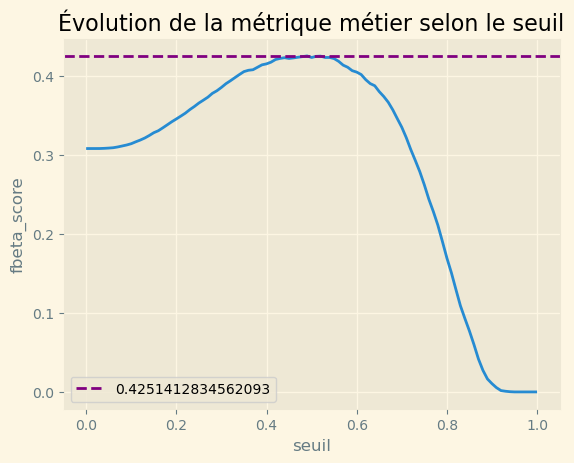

In [359]:
sns.lineplot(data=df_seuils, y= 'fbeta_score', x='seuil')
plt.title('Évolution de la métrique métier selon le seuil')
plt.axhline(y =fbeta_max, color='purple', linestyle='--', label=fbeta_max)
plt.legend()

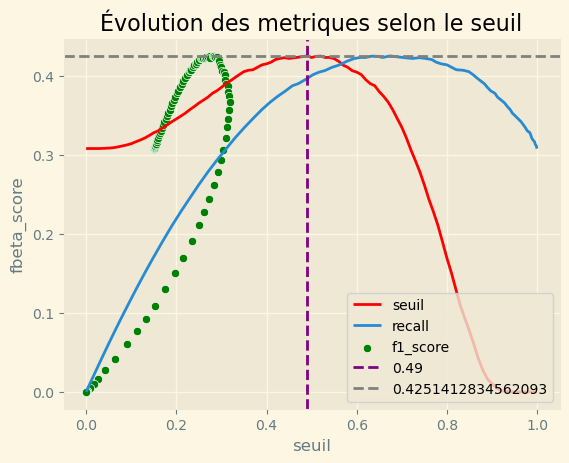

In [363]:
sns.lineplot(data=df_seuils, y= 'fbeta_score', x='seuil', label='seuil', color='red')
sns.lineplot(data=df_seuils, y= 'fbeta_score', x='recall', label='recall')
sns.scatterplot(data=df_seuils, y= 'fbeta_score', x='f1_score', label='f1_score', color='green')
plt.axvline(seuil_optimal, color='purple', linestyle='--', label=seuil_optimal)
plt.axhline(fbeta_max, color='grey', linestyle='--', label=fbeta_max)
plt.title('Évolution des metriques selon le seuil')
plt.legend(loc='lower right')


Text(0.5, 1.0, 'Distribution de la probabilté de la prediction')

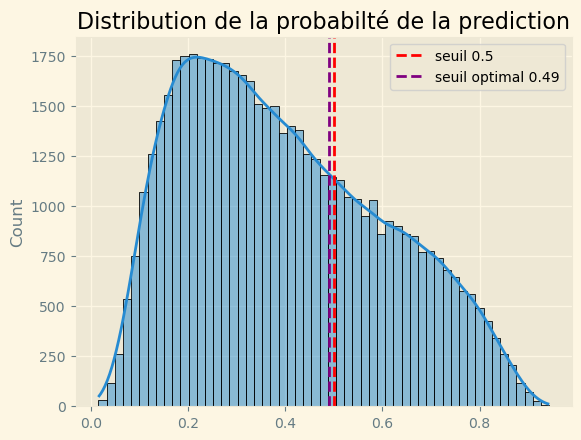

In [360]:
sns.histplot(x=y_val_prob, fill= True, kde=True)
plt.axvline(0.5, color='red', linestyle='--', label='seuil 0.5')
plt.axvline(seuil_optimal, color='purple', linestyle='--', label=f'seuil optimal {seuil_optimal}')
plt.legend()
plt.title('Distribution de la probabilté de la prediction')

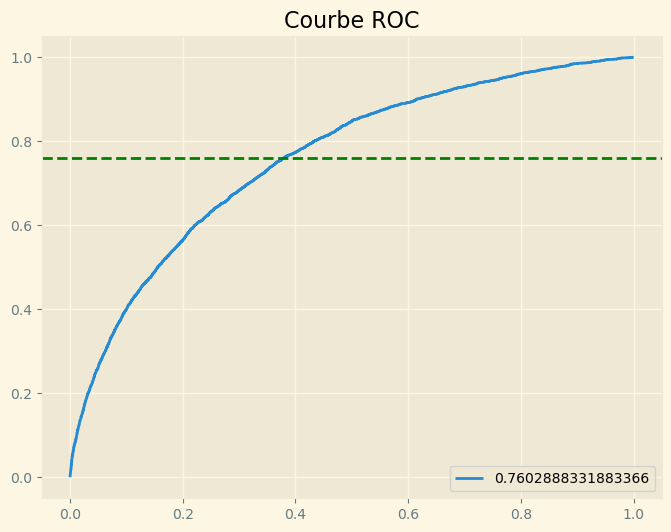

In [373]:
# Calcul des courbes ROC
fpr, tpr, thresholds = roc_curve(y_val, y_val_prob)
auc = roc_auc_score(y_val, y_val_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=auc)
plt.axhline(auc, color='green', linestyle='--')
plt.title('Courbe ROC')
plt.legend(loc='lower right')

## Evaluation finale

In [ ]:
#Test sur les données pas encore utilisées

In [382]:
X_test_reduced.shape

(92254, 134)

In [383]:
y_test = df_test['TARGET']

In [385]:
# Prédiction 
y_test_proba = model_lgbm_fbeta_fitted.predict_proba(X_test_reduced)
y_test_proba

array([[0.33226253, 0.66773747],
       [0.70581644, 0.29418356],
       [0.30087256, 0.69912744],
       ...,
       [0.7274236 , 0.2725764 ],
       [0.77928661, 0.22071339],
       [0.722793  , 0.277207  ]])

In [386]:
y_test_proba = y_test_proba[:,1]
y_test_pred = y_test_proba > seuil_optimal
y_test_pred

array([ True, False,  True, ..., False, False, False])

In [387]:
y_test_pred = y_test_pred.astype(int)# Convertir booelean en int
y_test_pred

array([1, 0, 1, ..., 0, 0, 0])

In [400]:
# Evaluation du modele 

recall = recall_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
f1score = f1_score(y_test, y_test_pred)
fbeta = fbeta_score(y_test, y_test_pred, beta=2)
test_auc = roc_auc_score(y_test, y_test_proba)
matrice_confusion = confusion_matrix(y_test, y_test_pred)

# Ajout dans df_perfomance
df_performance_finale = pd.DataFrame([{
    'Model': model_lgbm_fbeta_fitted.__class__.__name__,
    'Best Params': model_lgbm_fbeta_fitted.get_params(),
    'Accuracy' : accuracy_score(y_test, y_test_pred),
    'Recall': recall,
    'Precision': precision,
    'F1 Score': f1score,
    'AUC': test_auc,
    'Matrice de confusion': matrice_confusion,
    'F-beta Score': fbeta,
    
}])

In [401]:
df_performance_finale

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,AUC,Matrice de confusion,F-beta Score
0,LGBMClassifier,"{'boosting_type': 'gbdt', 'class_weight': 'bal...",0.70501,0.673546,0.167623,0.268441,0.758957,"[[60047, 24794], [2420, 4993]]",0.42001


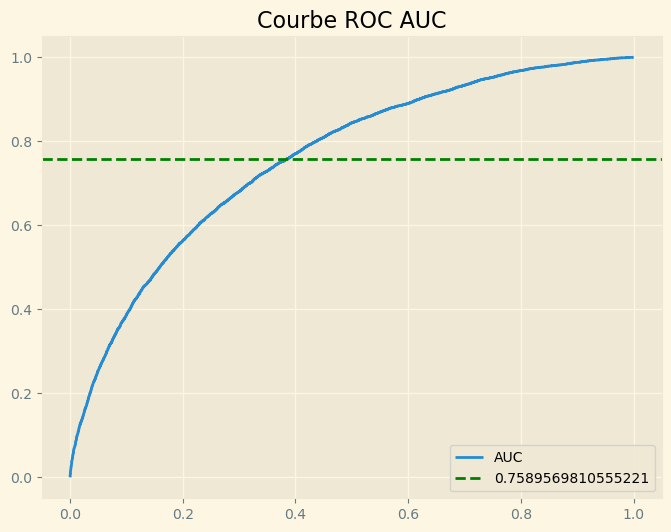

In [405]:
# Calcul des courbes ROC
fpr, tpr, thresholds = roc_curve(y_test, y_test_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='AUC')
plt.axhline(test_auc, color='green', linestyle='--', label=test_auc)
plt.title('Courbe ROC AUC')
plt.legend(loc='lower right')


## Interprétation

In [406]:
# créer l'objet explainer à partir du modèle
explainer = shap.Explainer(model_lgbm_fbeta_fitted)

In [407]:
# Calcul des valeurs (le score represantant la contribution de chaque feature sur la prediction)
shap_values = explainer(X_test_reduced)

#### Feature importance

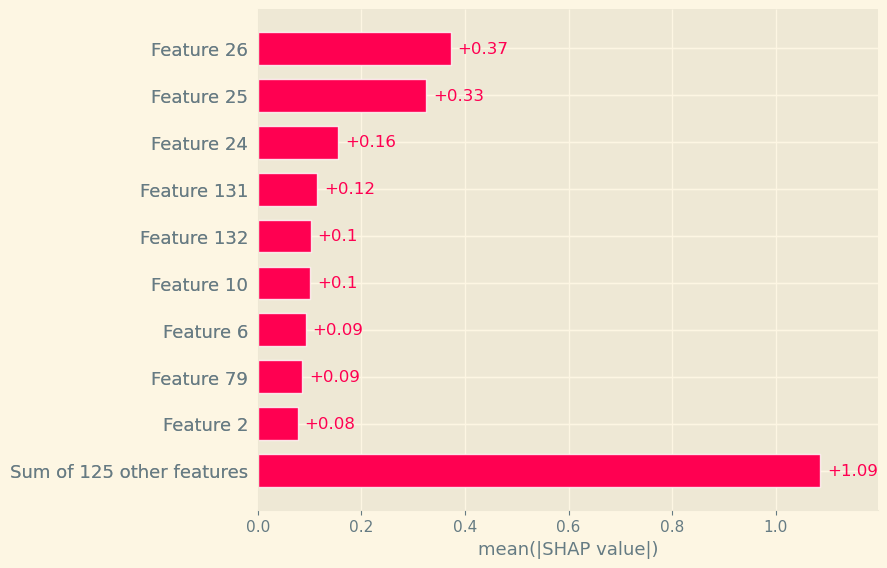

In [408]:

shap.plots.bar(shap_values)


In [409]:
X_test_reduced

array([[ 0.79879468,  0.        ,  1.        , ...,  0.52755443,
         1.11357123,  2.9244692 ],
       [ 0.32001976,  0.        ,  1.        , ...,  1.67284425,
         1.08748534,  2.27877026],
       [ 0.11853935,  0.        ,  1.        , ...,  0.76839261,
         0.99121148,  1.64207487],
       ...,
       [ 0.78802986,  0.        ,  0.        , ...,  0.69306494,
         1.09619326,  4.56740125],
       [ 0.30625426,  1.        ,  0.        , ...,  1.20493987,
         0.97936004,  1.16042251],
       [ 0.71675747,  0.        ,  1.        , ...,  0.85543154,
         1.32052207, 11.79326587]])

In [410]:
# reconstruire X_train_reduced avec le nom des features 
columns_name = X_test.columns[selector.get_support()] # selector.get_support() retourne un booléen si feature gardée ou non

In [411]:
# reconstruire X-train_reduced
X_test_reduced_name = pd.DataFrame(X_test_reduced, columns=columns_name)

In [412]:
X_test_reduced_name

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,ORGANIZATION_TYPE_Transport_type_3,FONDKAPREMONT_MODE_org_spec_account,FONDKAPREMONT_MODE_reg_oper_spec_account,HOUSETYPE_MODE_block_of_flats,WALLSMATERIAL_MODE_Panel,EMERGENCYSTATE_MODE_No,ratio_annuity_income,ratio_credit_annuity,ratio_credit_goods_price,ratio_work_age
0,0.798795,0.0,1.0,0.0,0.001550,0.104983,0.199000,0.094276,0.129331,0.327396,...,0.0,0.0,0.0,0.0,0.0,0.0,128.358724,0.527554,1.113571,2.924469
1,0.320020,0.0,1.0,1.0,0.001897,0.308792,0.184591,0.283951,0.090864,0.410879,...,0.0,0.0,0.0,1.0,0.0,1.0,97.328926,1.672844,1.087485,2.278770
2,0.118539,0.0,1.0,0.0,0.001512,0.112360,0.146227,0.113356,0.491595,0.587260,...,0.0,0.0,0.0,0.0,0.0,0.0,96.719133,0.768393,0.991211,1.642075
3,0.811696,0.0,0.0,1.0,0.001897,0.052360,0.090962,0.046016,0.635991,0.684160,...,0.0,0.0,0.0,0.0,1.0,1.0,47.961192,0.575622,1.137862,0.891904
4,0.515406,0.0,0.0,1.0,0.000742,0.065701,0.055563,0.048260,0.257000,0.723675,...,0.0,0.0,0.0,1.0,0.0,1.0,74.835779,1.182454,1.361388,1.296589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92249,0.686605,0.0,0.0,1.0,0.002474,0.297582,0.135240,0.259259,0.421848,0.532131,...,0.0,0.0,0.0,0.0,0.0,0.0,54.673102,2.200392,1.147816,1.185539
92250,0.150334,0.0,0.0,1.0,0.000358,0.046067,0.057862,0.047138,0.392880,0.959921,...,0.0,0.0,0.0,1.0,0.0,1.0,161.730407,0.796154,0.977287,0.945906
92251,0.788030,0.0,0.0,1.0,0.001897,0.033218,0.047929,0.030303,0.143358,0.174634,...,0.0,0.0,1.0,1.0,0.0,1.0,25.271468,0.693065,1.096193,4.567401
92252,0.306254,1.0,0.0,0.0,0.002666,0.050562,0.041962,0.051627,0.361433,0.782469,...,0.0,0.0,0.0,1.0,0.0,1.0,15.739902,1.204940,0.979360,1.160423


In [413]:
shap_values = explainer(X_test_reduced_name)

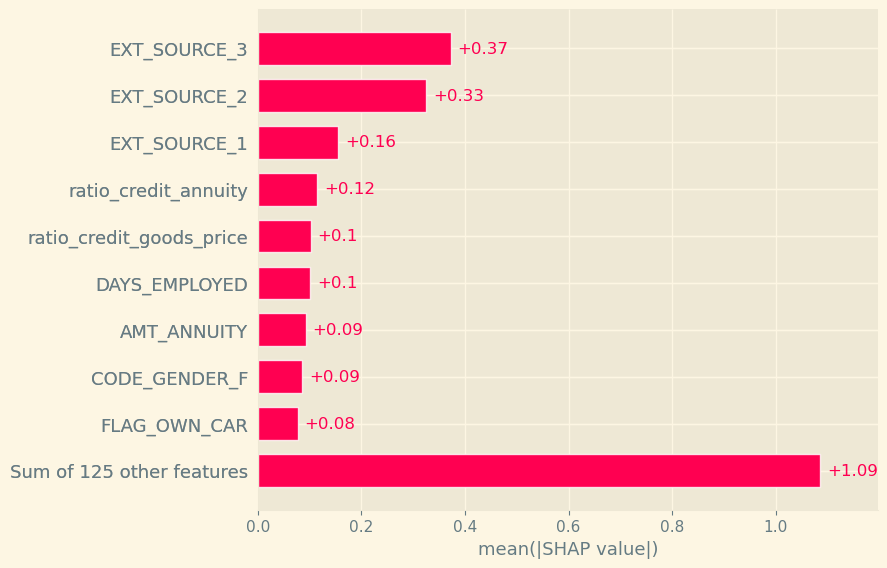

In [414]:
# Feature importance
shap.plots.bar(shap_values)

#### summary_plot

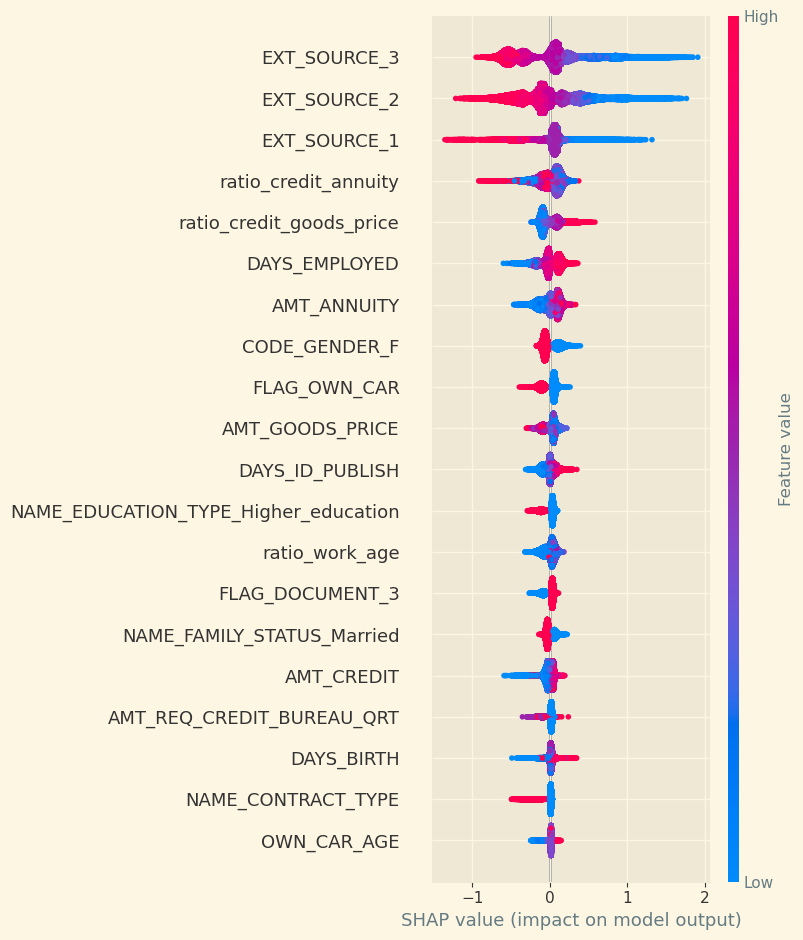

In [421]:
shap.summary_plot(shap_values)

#### waterfall

##### FP

In [ ]:
# Condition pour un client = 0 mais prédit 1
false_positif= np.where((y_test == 0)&(y_test_pred == 1))
index_false_positif = false_positif[0][0]
print(f'L"index du FP : {index_false_positif}')
y_test[index_false_positif], y_test_pred[index_false_positif]

L"index du FP : 0


(0, 1)

In [474]:
model_lgbm_fbeta_fitted.predict_proba(X_test_reduced_name.iloc[[index_false_positif]]) 


array([[0.33226253, 0.66773747]])

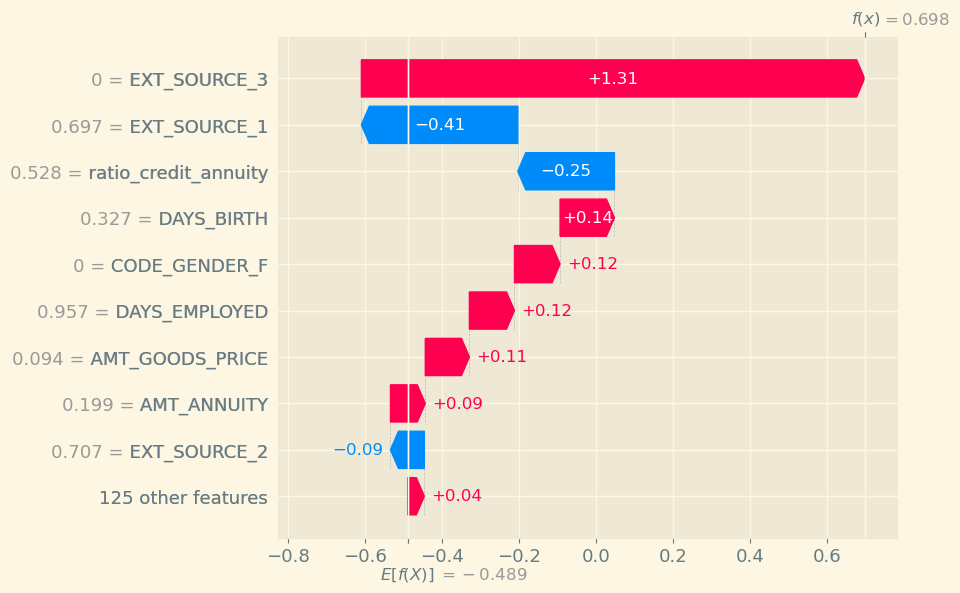

In [462]:
shap.plots.waterfall(shap_values[index_false_positif])

##### TN

In [491]:
true_negatif = np.where((y_test == 0) & (y_test_pred == 0))
index_true_negatif = true_negatif[0][0]
print(f'L"index du TN : {index_true_negatif}')
y_test[index_true_negatif], y_test_pred[index_true_negatif]

L"index du TN : 1


(0, 0)

In [480]:
# Proba de l'individu TN
model_lgbm_fbeta_fitted.predict_proba(X_test_reduced[[index_true_negatif]])

array([[0.70581644, 0.29418356]])

In [482]:
# Prédiction
model_lgbm_fbeta_fitted.predict(X_test_reduced[[index_true_negatif]])

array([0])

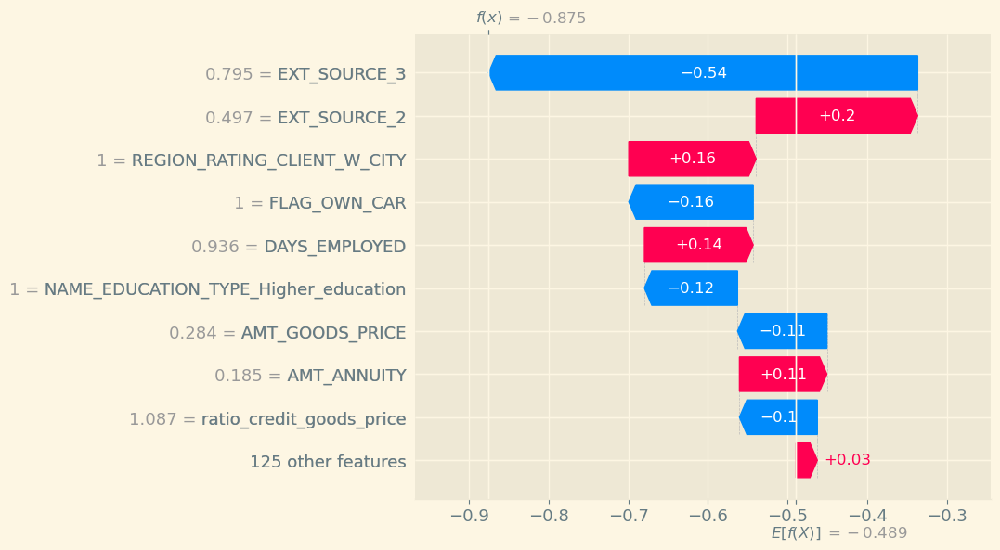

In [483]:
shap.plots.waterfall(shap_values[index_true_negatif])

##### TP

In [490]:
true_positif = np.where((y_test == 1)&(y_test == 1))
index_true_positif = true_positif[0][0]
print(f'L"index du TP : {index_true_positif}')
y_test[index_true_positif], y_test_pred[index_true_positif]

L"index du TP : 10


(1, 1)

In [487]:
model_lgbm_fbeta_fitted.predict_proba(X_test_reduced_name.iloc[[index_true_positif]])

array([[0.32557443, 0.67442557]])

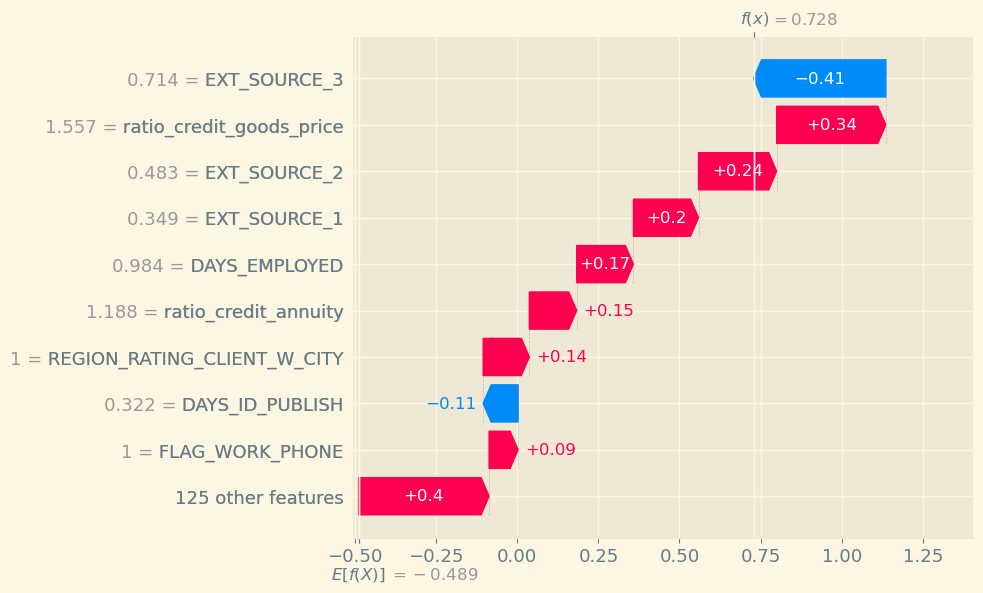

In [488]:
shap.plots.waterfall(shap_values[index_true_positif])

##### FN

In [495]:
false_negatif = np.where((y_test == 1)&(y_test_pred == 0))
index_false_negatif = false_negatif[0][0]
print(f'L"index du TP : {index_false_negatif}')
y_test[index_false_negatif], y_test_pred[index_false_negatif]

L"index du TP : 40


(1, 0)

In [496]:
model_lgbm_fbeta_fitted.predict_proba(X_test_reduced_name.iloc[[index_false_negatif]])

array([[0.76567652, 0.23432348]])

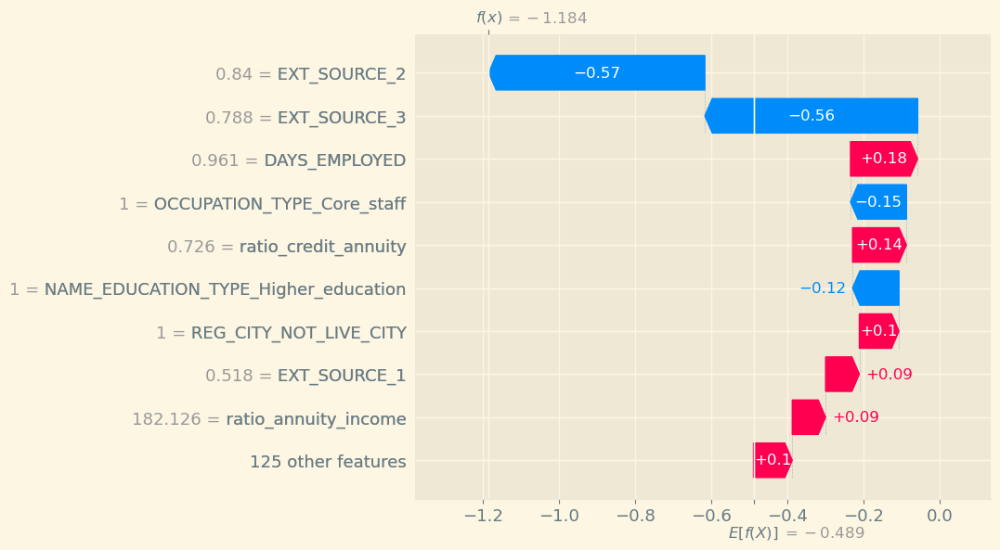

In [497]:
shap.plots.waterfall(shap_values[index_false_negatif])

## Conclusion

In [420]:
df_lgbm = df_performance.loc[df_performance['Model'] == 'LGBMClassifier', :]

In [421]:
df_lgbm

,Model,Best Params,Accuracy,Recall,Precision,F1 Score,Train AUC,Validation AUC,CV ROC AUC,Matrice de confusion,Méthode,F-beta Score
4,LGBMClassifier,{'random_state': 42},0.921142,0.016144,0.550388,0.031367,0.814207,0.752646,NaN,[[49359 58]\n [ 4327 71]],sans réglages,NaN
8,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.918294,0.011141,0.505155,0.021802,0.794170,0.755158,0.753647,[[49369 48]\n [ 4349 49]],gridsearch,NaN
12,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.717731,0.658026,0.170727,0.271113,0.796659,0.753959,NaN,[[35360 14057]\n [ 1504 2894]],class_weight,NaN
13,LGBMClassifier,"{'n_estimators': 10000, 'learning_rate': 0.02,...",0.944971,0.041382,0.437500,0.075613,0.974186,0.732624,NaN,[[49183 234]\n [ 4216 182]],exp kaggle,NaN
15,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.721107,0.660073,0.172695,0.273765,0.801247,0.757241,NaN,[[35510 13907]\n [ 1495 2903]],avec feature engineering,NaN
18,LGBMClassifier,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.721107,0.660073,0.172695,0.273765,0.801247,0.757241,NaN,[[35510 13907]\n [ 1495 2903]],feat.engineering + feat.reduits,NaN
20,LGBMClassifier,"{'class_weight': 'balanced', 'learning_rate': ...",0.717830,0.657344,0.174482,0.275767,0.812099,0.760289,0.421511,[[35739 13678]\n [ 1507 2891]],Fbeta,0.4231433506044905
21,LGBMClassifier,"{'boosting_type': 'gbdt', 'class_weight': 'bal...",0.707572,0.673943,0.171657,0.273621,0.812099,0.760289,NaN,[[35114 14303]\n [ 1434 2964]],Application du seuil 0.49,meilleur fbeta 0.4251412834562093


In [422]:
df_lgbm = df_lgbm.drop(13)

In [ ]:
df_lgbm

Text(0.5, 1.0, 'Evolution du Recall pour LGBMClassifier')

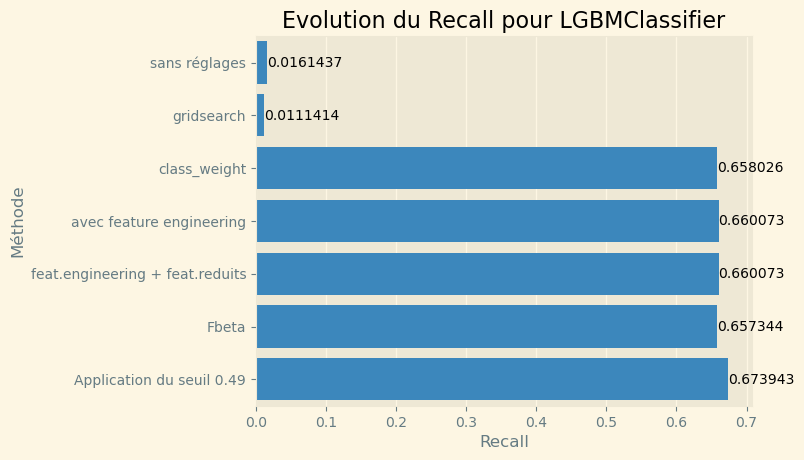

In [429]:
plt.style.use('Solarize_Light2')
ax = sns.barplot(data = df_lgbm, x = 'Recall', y= 'Méthode')
ax.bar_label(ax.containers[0])
plt.title('Evolution du Recall pour LGBMClassifier')
# plt.xlim(0.6, 0.8)

Text(0.5, 1.0, 'Evolution du F1 Score pour LGBMClassifier')

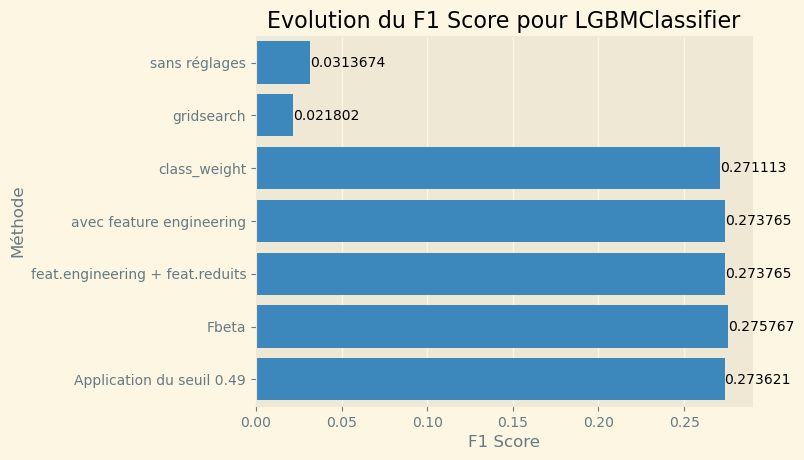

In [431]:
plt.style.use('Solarize_Light2')
ax = sns.barplot(data = df_lgbm, x = 'F1 Score', y= 'Méthode')
ax.bar_label(ax.containers[0])
plt.title('Evolution du F1 Score pour LGBMClassifier')
# plt.xlim(0.6, 0.8)

(0.6, 0.8)

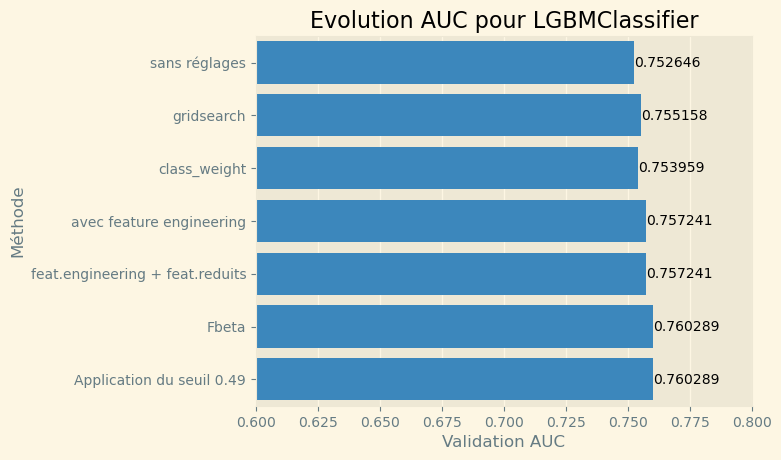

In [436]:
plt.style.use('Solarize_Light2')
ax = sns.barplot(data = df_lgbm, x = 'Validation AUC', y= 'Méthode')
ax.bar_label(ax.containers[0])
plt.title('Evolution AUC pour LGBMClassifier')
plt.xlim(0.6, 0.8)

In [1]:
df_performance

NameError: name 'df_performance' is not defined